## **AI for Epigraphy: Ανάλυση Εικόνων και Κειμένων Αρχαίων Ελληνικών Επιγραφών**

**Εφαρμοσμένη Επιστήμη Δεδομένων — Ομαδική Εργασία 2026**

Σε αυτή την εργασία θα σχεδιάσετε ένα πλήρες υπολογιστικό pipeline για την ανάλυση αρχαίων ελληνικών επιγραφών. Το σύνολο δεδομένων αποτελεί μέρος του ICDAR 2026 Competition in Text Recognition on Greek Squeezes και είναι διαθέσιμο [εδώ](https://www.science.smith.edu/~nhowe/contest/trogs26.html#dataset).

Τα δεδομένα περιλαμβάνουν μεταγραφές κειμένων (λατινικοί χαρακτήρες σε μορφή scriptio continua) και εικόνες επιγραφών (squeezes).

---






In [1]:
##from google.colab import drive
##drive.mount('/content/drive')

In [2]:
'''
!unzip -q "/content/drive/MyDrive/GREEK_SQUEEZES/Annotations.zip" -d "/content/Annotations"
!unzip -q "/content/drive/MyDrive/GREEK_SQUEEZES/Images1.zip" -d "/content/Images1"
!unzip -q "/content/drive/MyDrive/GREEK_SQUEEZES/Images4.zip" -d "/content/Images4"

print("Folders Unzipped")'''

'\n!unzip -q "/content/drive/MyDrive/GREEK_SQUEEZES/Annotations.zip" -d "/content/Annotations"\n!unzip -q "/content/drive/MyDrive/GREEK_SQUEEZES/Images1.zip" -d "/content/Images1"\n!unzip -q "/content/drive/MyDrive/GREEK_SQUEEZES/Images4.zip" -d "/content/Images4"\n\nprint("Folders Unzipped")'

## Άδειες Χρήσης Δεδομένων

| Πηγή | Άδεια | Απαίτηση |
|------|-------|----------|
| ICDAR 2026 / Smith College Dataset | CC-BY 4.0 | Υποχρεωτική αναφορά στην πηγή |
| Aeneas/Ithaca (DeepMind) | Apache 2.0 | Αναφορά πηγής |

## Αναφορές

Howe, N.R., Chang, F., Falbo, I., Brown, T. & Hershkowitz, A. "Character
Recognition for Greek Squeezes." IJDAR 28, 345–356 (2025).

## Πηγές Δεδομένων

- ICDAR 2026 Competition: https://www.science.smith.edu/~nhowe/contest/trogs26.html
- Character Recognition for Greek Squeezes (Smith College): https://scholarworks.smith.edu/dds_data/18
- Aeneas/Ithaca (DeepMind): https://github.com/google-deepmind/predictingthepast
- Papyri corpus (Ericu950/Papyri_1): https://huggingface.co/datasets/Ericu950/Papyri_1

In [3]:
import os

annotations_dir = 'D:/Uni/eksoriksh/erg/data/Annotations'
images_dirs = ['D:/Uni/eksoriksh/erg/data/Images1','D:/Uni/eksoriksh/erg/data/Images2','D:/Uni/eksoriksh/erg/data/Images3','D:/Uni/eksoriksh/erg/data/Images4']

ann_files = {f.replace('_letters.txt', '') for f in os.listdir(annotations_dir) if f.endswith('.txt')}

img_ids = set()
for d in images_dirs:
    if os.path.exists(d):
        for f in os.listdir(d):
            if f.endswith('.png'):
                img_ids.add(f.replace('.png', ''))

valid_pairs = ann_files.intersection(img_ids)

print(f"Συνολικά αρχεία κειμένου (Annotations): {len(ann_files)}")
print(f"Συνολικές εικόνες: {len(img_ids)}")
print("-" * 30)
print(f"Σύνολο ζευγαριών: {len(valid_pairs)}")

if valid_pairs:
    print("\nΔείγμα αντιστοιχίσεων:")
    for item in list(valid_pairs)[:5]:
        print(f"ID: {item}")

Συνολικά αρχεία κειμένου (Annotations): 448
Συνολικές εικόνες: 448
------------------------------
Σύνολο ζευγαριών: 448

Δείγμα αντιστοιχίσεων:
ID: IG_II2_112b_Rotation1_300dpi
ID: IG_II2_5_Copy2_Rotation2_300dpi
ID: IG_II2_1932_Rotation1_300dpi
ID: IAS33161_Rotation2_300dpi
ID: IG_II2_1719_Copy1_Rotation1_300dpi


## Μέρος Α — Ανάλυση Κειμένων (50 μονάδες)

**Α1.** Μετατρέψτε τους λατινικούς χαρακτήρες των μεταγραφών σε κεφαλαία ελληνικά γράμματα (δεν απαιτούνται τόνοι/πνεύματα), ώστε οι μεταγραφές να γίνουν αναγνώσιμο αρχαίο ελληνικό κείμενο. Μπορείτε να χρησιμοποιήσετε το βοηθητικό αρχείο PDF "Proxies" στον φάκελο Annotations. Περιγράψτε το σύστημα μεταγραφής σας και παρέχετε παραδείγματα πριν/μετά τη μετατροπή. *(6 μονάδες)*


In [4]:
import os, re
import pandas as pd
import matplotlib.pyplot as plt

ANNOTATIONS_DIR = r'D:/Uni/eksoriksh/erg/data/Annotations'

# Latin proxy → Greek uppercase (από Proxies.pdf)
LATIN_TO_GREEK = {
    'A': 'Α', 'B': 'Β', 'G': 'Γ', 'D': 'Δ', 'E': 'Ε',
    'Z': 'Ζ', 'H': 'Η', 'Q': 'Θ', 'I': 'Ι', 'K': 'Κ',
    'L': 'Λ', 'M': 'Μ', 'N': 'Ν', 'X': 'Ξ', 'O': 'Ο',
    'P': 'Π', 'R': 'Ρ', 'S': 'Σ', 'T': 'Τ', 'Y': 'Υ',  # Y=Υ (upsilon)
    'F': 'Φ', 'C': 'Χ', 'U': 'Ψ', 'W': 'Ω',             # U=Ψ (psi)
    '*': '*', ':': ':', ')': ')'
}

def latin_to_greek(text):
    """Μετατρέπει Latin proxy string σε κεφαλαία ελληνικά."""
    return ''.join(LATIN_TO_GREEK.get(c.upper(), c) for c in text)

# Test με γραμμές από το Agora_I_4985
test_lines = ['STOKAI', 'NPOLEWSAP', 'NIOSAQHN', 'ODONAIEA*', 'NEANTISA']
print(f"{'Latin proxy':25s} → Ελληνικά")
print('-' * 42)
for t in test_lines:
    print(f'  {t:23s} → {latin_to_greek(t)}')

def get_transcript(fpath):
    """Επιστρέφει τις γραμμές του # Transcript section."""
    lines, in_tr = [], False
    with open(fpath, 'r', encoding='utf-8', errors='replace') as f:
        for line in f:
            line = line.strip()
            if line == '# Transcript': in_tr = True;  continue
            if in_tr:
                if line.startswith('#'): break
                if line: lines.append(line)
    return lines


all_files = [f for f in os.listdir(ANNOTATIONS_DIR) if f.endswith('.txt')]
print(f'Αρχεία annotations: {len(all_files)}')

corpus = []
for fname in sorted(all_files):
    insc_id = fname.replace('_letters.txt', '')
    for line in get_transcript(os.path.join(ANNOTATIONS_DIR, fname)):
        corpus.append({
            'inscription_id': insc_id,
            'latin':  line,
            'greek':  latin_to_greek(line)
        })

df = pd.DataFrame(corpus)
print(f'Συνολικές γραμμές: {len(df):,}')
df.head(10)

print('=' * 60)
print('ΠΑΡΑΔΕΙΓΜΑΤΑ ΜΕΤΑΤΡΟΠΗΣ  (Latin proxy → Ελληνικά)')
print('=' * 60)

for insc_id in df['inscription_id'].unique()[:5]:
    print(f'\n── {insc_id} ──')
    subset = df[df['inscription_id'] == insc_id].head(4)
    for _, row in subset.iterrows():
        print(f'  Latin : {row["latin"]}')
        print(f'  Greek : {row["greek"]}')


Latin proxy               → Ελληνικά
------------------------------------------
  STOKAI                  → ΣΤΟΚΑΙ
  NPOLEWSAP               → ΝΠΟΛΕΩΣΑΠ
  NIOSAQHN                → ΝΙΟΣΑΘΗΝ
  ODONAIEA*               → ΟΔΟΝΑΙΕΑ*
  NEANTISA                → ΝΕΑΝΤΙΣΑ
Αρχεία annotations: 448
Συνολικές γραμμές: 8,989
ΠΑΡΑΔΕΙΓΜΑΤΑ ΜΕΤΑΤΡΟΠΗΣ  (Latin proxy → Ελληνικά)

── Agora_I_4985_Rotation1_300dpi ──
  Latin : STOKAI
  Greek : ΣΤΟΚΑΙ
  Latin : *DIKOSE*
  Greek : *ΔΙΚΟΣΕ*
  Latin : IHIDIKHT
  Greek : ΙΗΙΔΙΚΗΤ
  Latin : OSENNEA*
  Greek : ΟΣΕΝΝΕΑ*

── Agora_I_4985_Rotation2_300dpi ──
  Latin : STOKAI
  Greek : ΣΤΟΚΑΙ
  Latin : *DIKOSE*
  Greek : *ΔΙΚΟΣΕ*
  Latin : IHIDIKHT
  Greek : ΙΗΙΔΙΚΗΤ
  Latin : OSENNEA*
  Greek : ΟΣΕΝΝΕΑ*

── Agora_I_5477_Rotation1_300dpi ──
  Latin : RCONTOS
  Greek : ΡΧΟΝΤΟΣ
  Latin : *RISTONIKOS ARI
  Greek : *ΡΙΣΤΟΝΙΚΟΣ ΑΡΙ
  Latin : *N***HI AGAQHI TOY DHMO*
  Greek : *Ν***ΗΙ ΑΓΑΘΗΙ ΤΟΥ ΔΗΜΟ*
  Latin : AQHNAI H QYSIA WS KALLIST
  Greek : ΑΘΗΝΑΙ Η ΘΥΣΙΑ ΩΣ ΚΑΛΛΙΣΤ

## Α1.Μετατροπή Latin Proxy → Ελληνικά
Οι μεταγραφές των επιγραφών χρησιμοποιούν Latin proxy encoding: κάθε λατινικό γράμμα αντιστοιχεί σε ένα ελληνικό, βάσει του αρχείου Proxies.pdf. Υλοποιήθηκε λεξικό LATIN_TO_GREEK και συνάρτηση get_transcript() που εξάγει τις γραμμές κειμένου από την ενότητα # Transcript κάθε αρχείου annotations. Το dataset περιλαμβάνει 448 επιγραφές σε δύο rotations (Rotation1, Rotation2).


**Α2.** Οι μεταγραφές δεν περιέχουν κενά μεταξύ λέξεων (scriptio continua). Προτείνετε και υλοποιήστε μια στρατηγική τμηματοποίησης σε επίπεδο **λέξεων** (word segmentation) — δηλαδή εισαγωγή κενών ανάμεσα σε λέξεις, όχι τμηματοποίηση σε προτάσεις ή παραγράφους. Εξηγήστε τη μέθοδό σας, παρουσιάστε παραδείγματα, και συζητήστε τις προκλήσεις. *(10 μονάδες)*

**Hint:** Για την κατασκευή λεξιλογίου μπορείτε να χρησιμοποιήσετε ένα corpus αρχαίων ελληνικών παπύρων:
```python
ds = load_dataset("Ericu950/Papyri_1", split="train", streaming=True)
```


In [5]:
import math, json, re
from collections import Counter

PAPYRI_JSONL = 'papyri_train.jsonl'

# ── Αντίστροφο mapping από Α1: Greek Unicode → Latin proxy ──
GREEK_TO_LATIN = {v.lower(): k.lower() for k, v in LATIN_TO_GREEK.items() if k.isalpha()}
GREEK_TO_LATIN['ς'] = 's'  # τελική σίγμα

def greek_word_to_latin(word):
    return ''.join(GREEK_TO_LATIN.get(c, '') for c in word.lower())

# Λεξιλόγιο από Papyri corpus 
word_counts = Counter()
with open(PAPYRI_JSONL, 'r', encoding='utf-8') as f:
    for line in f:
        obj = json.loads(line)
        text = obj.get('Edition_with_brackets', '')
        for w in re.findall(r'[α-ωά-ώ]+', text.lower()):
            latin = greek_word_to_latin(w)
            if latin: word_counts[latin] += 1

MIN_COUNT = 3
vocab  = {w: c for w, c in word_counts.items() if c >= MIN_COUNT}
total  = sum(vocab.values())
log_prob = {w: math.log(c / total) for w, c in vocab.items()}
print(f'Tokens corpus : {sum(word_counts.values()):,}')
print(f'Λεξιλόγιο     : {len(vocab):,} λέξεις')
print('Top-10        :', word_counts.most_common(10))

# Viterbi Word Segmentation 
OOV_PENALTY = math.log(1e-6)

def word_log_prob(w):
    w = w.lower()
    return log_prob[w] if w in log_prob else OOV_PENALTY * max(len(w), 1)

def viterbi_segment(text, max_len=18):
    """
    Τμηματοποίηση με Dynamic Programming.
    Βρίσκει τη διαμέριση w1...wk που μεγιστοποιεί sum(log P(wi)).
    """
    n    = len(text)
    best = [float('-inf')] * (n + 1)
    back = [0] * (n + 1)
    best[0] = 0.0
    for i in range(1, n + 1):
        for j in range(max(0, i - max_len), i):
            if best[j] == float('-inf'): continue
            score = best[j] + word_log_prob(text[j:i])
            if score > best[i]: best[i] = score; back[i] = j
    words, i = [], n
    while i > 0: words.append(text[back[i]:i]); i = back[i]
    return [w.upper() for w in reversed(words)]

#Εφαρμογή σε όλες τις επιγραφές
segmented = {}
for fname in sorted(os.listdir(ANNOTATIONS_DIR)):
    if not fname.endswith('.txt'): continue
    insc_id = fname.replace('_letters.txt', '')
    raw = get_transcript(os.path.join(ANNOTATIONS_DIR, fname))
    if not raw: continue
    segmented[insc_id] = [
        viterbi_segment(re.sub(r'[^a-zA-Z]', '', line).lower())
        for line in raw if re.sub(r'[^a-zA-Z]', '', line)
    ]
print(f'Segmentation ολοκληρώθηκε για {len(segmented)} επιγραφές.')

#Παραδείγματα
print('\n' + '='*60)
print('ΠΑΡΑΔΕΙΓΜΑΤΑ ΤΜΗΜΑΤΟΠΟΙΗΣΗΣ  (Πριν → Μετά)')
print('='*60)
annotations_raw = {fname.replace('_letters.txt',''): get_transcript(os.path.join(ANNOTATIONS_DIR, fname))
                   for fname in sorted(os.listdir(ANNOTATIONS_DIR)) if fname.endswith('.txt')}
for insc_id in list(segmented.keys())[:3]:
    print(f'\n── {insc_id} ──')
    for raw, words in zip(annotations_raw[insc_id][:4], segmented[insc_id][:4]):
        print(f'  Πριν : {raw}')
        print(f'  Μετά : {" ".join(words)}')

#DataFrame για Α3, Α4, Α5 
import pandas as pd
rows = [
    {'inscription_id': iid, 'line_idx': li, 'word': w, 'word_length': len(w)}
    for iid, seg_lines in segmented.items()
    for li, words in enumerate(seg_lines)
    for w in words
]
df_words = pd.DataFrame(rows)
print(f'\ndf_words: {len(df_words):,} λέξεις, {df_words["word"].nunique():,} μοναδικές')
df_words.head()


Tokens corpus : 3,384,318
Λεξιλόγιο     : 50,281 λέξεις
Top-10        : [('kai', 138163), ('toy', 77054), ('a', 42155), ('ths', 38464), ('d', 35349), ('etoys', 34314), ('twn', 31809), ('h', 31156), ('en', 26868), ('dracmai', 25917)]
Segmentation ολοκληρώθηκε για 448 επιγραφές.

ΠΑΡΑΔΕΙΓΜΑΤΑ ΤΜΗΜΑΤΟΠΟΙΗΣΗΣ  (Πριν → Μετά)

── Agora_I_4985_Rotation1_300dpi ──
  Πριν : STOKAI
  Μετά : S TO KAI
  Πριν : *DIKOSE*
  Μετά : DI KO SE
  Πριν : IHIDIKHT
  Μετά : IH I DIKH T
  Πριν : OSENNEA*
  Μετά : OS ENNEA

── Agora_I_4985_Rotation2_300dpi ──
  Πριν : STOKAI
  Μετά : S TO KAI
  Πριν : *DIKOSE*
  Μετά : DI KO SE
  Πριν : IHIDIKHT
  Μετά : IH I DIKH T
  Πριν : OSENNEA*
  Μετά : OS ENNEA

── Agora_I_5477_Rotation1_300dpi ──
  Πριν : RCONTOS
  Μετά : R CONTOS
  Πριν : *RISTONIKOS ARI
  Μετά : RIS TON IKOS ARI
  Πριν : *N***HI AGAQHI TOY DHMO*
  Μετά : NHI AGAQHI TOY DHMO
  Πριν : AQHNAI H QYSIA WS KALLIST
  Μετά : AQHNAI H Q YSIA WS KALLIST

df_words: 38,418 λέξεις, 3,510 μοναδικές


,inscription_id,line_idx,word,word_length
0,Agora_I_4985_Rotation1_300dpi,0,S,1
1,Agora_I_4985_Rotation1_300dpi,0,TO,2
2,Agora_I_4985_Rotation1_300dpi,0,KAI,3
3,Agora_I_4985_Rotation1_300dpi,1,DI,2
4,Agora_I_4985_Rotation1_300dpi,1,KO,2


## Α2.Word Segmentation 
Οι μεταγραφές είναι σε scriptio continua (χωρίς κενά). Επιλέχθηκε Dictionary-Based Parsing με Viterbi Dynamic Programming, καθώς η εκφώνηση δίνει hint για corpus λεξιλογίου. 

**Μέθοδος Viterbi**

Το λεξιλόγιο κατασκευάστηκε από το corpus Papyri_1 με μετατροπή Greek Unicode → Latin proxy. Ο αλγόριθμος βρίσκει τη διαμέριση w1w2 μέχρι wk που μεγιστοποιεί το άθροισμα log P(wi), επιτρέποντας λύση O(n·L). Σε κάθε θέση i υπολογίζουμε το μέγιστο άθροισμα log-probabilities για τους πρώτους i χαρακτήρες .Χρησιμοποιούνται backpointers για ανακατασκευή της βέλτιστης λύσης.

**Προκλήσεις**

Lacunae (*): αφαιρούνται πριν τη segmentation εισάγοντας αβεβαιότητα. Κύρια ονόματα και τοπωνύμια σπάνε σε μικρότερα κομμάτια. Το λεξιλόγιο παπύρων δεν καλύπτει πλήρως το λεξιλόγιο λίθινων επιγραφών.


**Α3.** Υπολογίστε το μέγεθος του λεξιλογίου, εντοπίστε τις πιο συχνές λέξεις και ανιχνεύστε σπάνιες λέξεις. Απεικονίστε τα αποτελέσματά σας. *(6 μονάδες)*


Συνολικά tokens (λέξεις με επαναλήψεις) : 38,418
Μέγεθος λεξιλογίου (μοναδικές λέξεις)  : 3,510

Hapax legomena (<=2 φορές): 1,748 (49.8% του λεξιλογίου)
Δείγμα: ['ISCY', 'DIKH', 'NEAN', 'ADIKWN', 'PATAS', 'ENHNOCEN', 'ENEGKE', 'APAS', 'FILEAS', 'LION']


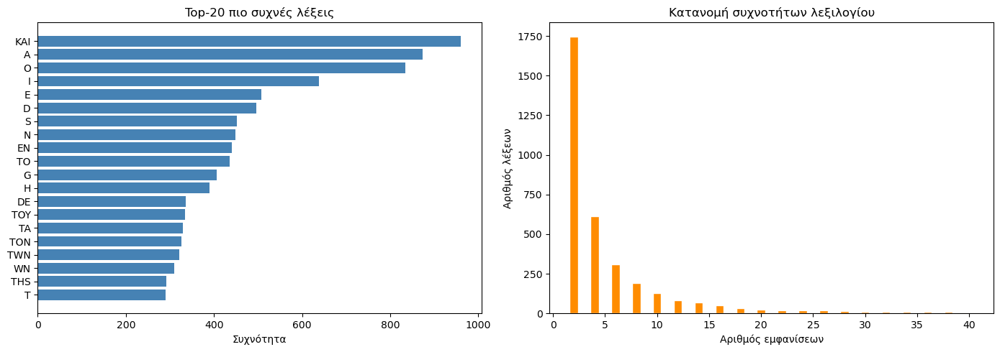

<Figure size 640x480 with 0 Axes>

In [6]:
import matplotlib.pyplot as plt

word_freq    = df_words['word'].str.upper().value_counts()
total_tokens = len(df_words)
total_types  = df_words['word'].nunique()

#Μέγεθος λεξιλογίου
print(f'Συνολικά tokens (λέξεις με επαναλήψεις) : {total_tokens:,}')
print(f'Μέγεθος λεξιλογίου (μοναδικές λέξεις)  : {total_types:,}')

#Σπάνιες λέξεις
hapax = word_freq[word_freq <= 2]
print(f'\nHapax legomena (<=2 φορές): {len(hapax):,} ({len(hapax)/total_types*100:.1f}% του λεξιλογίου)')
print(f'Δείγμα: {list(hapax.index[:10])}')

#Γραφήματα
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

#Top-20 συχνότερες λέξεις
top20 = word_freq.head(20)
axes[0].barh(top20.index[::-1], top20.values[::-1], color='steelblue')
axes[0].set_title('Top-20 πιο συχνές λέξεις')
axes[0].set_xlabel('Συχνότητα')

freq_dist = word_freq.value_counts().sort_index().head(20)
axes[1].bar(freq_dist.index, freq_dist.values, color='darkorange', edgecolor='white')
axes[1].set_title('Κατανομή συχνοτήτων λεξιλογίου')
axes[1].set_xlabel('Αριθμός εμφανίσεων')
axes[1].set_ylabel('Αριθμός λέξεων')

plt.tight_layout()
plt.savefig('a3_vocabulary_stats.png', dpi=150, bbox_inches='tight')
plt.show()

plt.tight_layout()
plt.savefig('a3_vocabulary_stats.png', dpi=150, bbox_inches='tight')
plt.show()


## Α3.  Λεξιλόγιο & Συχνότητα Λέξεων 
Υπολογίστηκαν τα βασικά μεγέθη του λεξιλογίου (tokens, types) και η κατανομή συχνοτήτων. 
- **Tokens:** συνολικές εμφανίσεις λέξεων (με επαναλήψεις)
- **Types:** μοναδικές λέξεις 
- **Hapax legomena:** λέξεις με ελάχιστες εμφανίσει, κυρίως κύρια ονόματα και λέξεις εκτός λεξιλογίου

Λόγω των 2 rotations ανά επιγραφή, η ελάχιστη συχνότητα λέξης είναι 2. Στο αριστερό γράφημα φαίνονται οι top-20 συχνότερες λέξεις. Το δεξί δείχνει την κατανομή συχνοτήτων, εδώ φαίνεται ο μεγάλος αριθμός σπάνιων λέξεων.


**Α4.** Εξερευνήστε τα κύρια ονόματα που εμφανίζονται στις επιγραφές σας και παρέχετε γραφήματα κατανομής συχνότητας ανά φύλο (gender). *(6 μονάδες)*


Υποψήφια κύρια ονόματα: 1,152
  Αρσενικά (M): 813
  Θηλυκά  (F): 339

Συνολικές εμφανίσεις ονομάτων: 5,220
gender
F    1498
M    3722
Name: word, dtype: int64


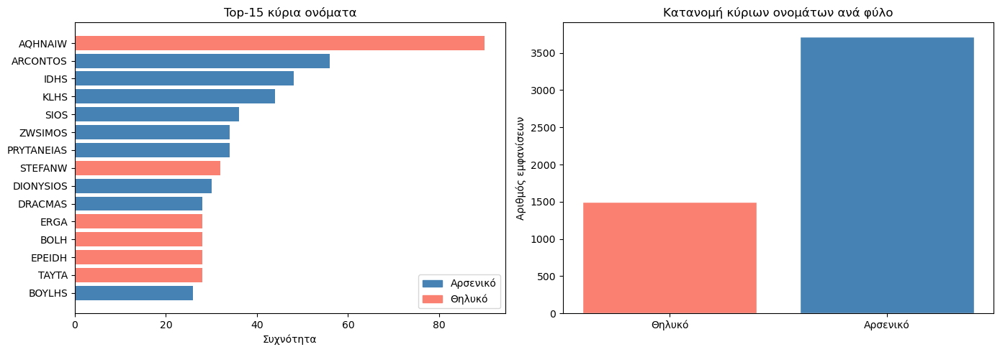

In [7]:
import matplotlib.pyplot as plt

"""Εντοπισμός κύριων ονομάτων με κανόνες κατάληξης 
το φύλο φαίνεται από την κατάληξη της λέξης
χρησιμοποιούμε Latin proxy encoding (από Proxies.pdf):
Αρσενικά: -OS, -WN, -HS, -AS, -IS
Θηλυκά:   -H, -A, -W"""

MALE_ENDINGS   = ('OS', 'WN', 'HS', 'AS', 'IS')
FEMALE_ENDINGS = ('H', 'A', 'W')

# Λέξεις που σίγουρα ΔΕΝ είναι ονόματα (συχνές λέξεις από Α3)
NON_NAMES = {
    'KAI', 'TOY', 'TWN', 'THS', 'TON', 'TAS', 'TOIS', 'TAIS',
    'EIS', 'APO', 'EPI', 'PRO', 'MEN', 'GAR', 'OTI', 'ALLA',
    'PROS', 'PERI', 'META', 'PARA', 'KATA', 'ANTI', 'ANA',
    'ESTIN', 'EINAI', 'EISI', 'EDWKEN', 'EDOXEN',
    'DEMOS', 'POLIS', 'BOULE', 'NOMOS', 'ERGON',
    'AGATHOS', 'KALOS', 'NEOS', 'PRWTOS',
}

def classify_name(word):
    """Επιστρέφει 'M', 'F' ή None αν δεν είναι όνομα."""
    w = word.upper()
    if w in NON_NAMES: return None
    if len(w) < 4: return None  # πολύ μικρές λέξεις δεν είναι ονόματα
    if w.endswith(MALE_ENDINGS):   return 'M'
    if w.endswith(FEMALE_ENDINGS): return 'F'
    return None

# Εφαρμογή σε όλες τις μοναδικές λέξεις 
unique_words = df_words['word'].unique()
names_gender = {w: classify_name(w) for w in unique_words}
names_gender = {w: g for w, g in names_gender.items() if g is not None}

print(f'Υποψήφια κύρια ονόματα: {len(names_gender):,}')
print(f'  Αρσενικά (M): {sum(1 for g in names_gender.values() if g == "M"):,}')
print(f'  Θηλυκά  (F): {sum(1 for g in names_gender.values() if g == "F"):,}')

#Συχνότητα ονομάτων στο corpus 
df_names = df_words[df_words['word'].isin(names_gender.keys())].copy()
df_names['gender'] = df_names['word'].map(names_gender)

name_freq     = df_names['word'].value_counts()
gender_counts = df_names.groupby('gender')['word'].count()

print(f'\nΣυνολικές εμφανίσεις ονομάτων: {len(df_names):,}')
print(gender_counts)

#Γραφήματα 
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Αριστερά: Top-15 ονόματα με χρώμα ανά φύλο
top15  = name_freq.head(15)
colors = ['steelblue' if names_gender.get(n) == 'M' else 'salmon'
          for n in top15.index]
axes[0].barh(top15.index[::-1], top15.values[::-1], color=colors[::-1])
axes[0].set_title('Top-15 κύρια ονόματα')
axes[0].set_xlabel('Συχνότητα')
from matplotlib.patches import Patch
axes[0].legend(handles=[
    Patch(color='steelblue', label='Αρσενικό'),
    Patch(color='salmon',    label='Θηλυκό')
])

# Δεξιά: Κατανομή ανά φύλο
gender_labels = {'M': 'Αρσενικό', 'F': 'Θηλυκό'}
labels = [gender_labels.get(g, g) for g in gender_counts.index]
axes[1].bar(labels, gender_counts.values,
            color=['salmon','steelblue'], edgecolor='white')
axes[1].set_title('Κατανομή κύριων ονομάτων ανά φύλο')
axes[1].set_ylabel('Αριθμός εμφανίσεων')

plt.tight_layout()
plt.savefig('a4_names_gender.png', dpi=150, bbox_inches='tight')
plt.show()


## Α4.Κύρια Ονόματα & Κατανομή Φύλου 
Εντοπισμός κύριων ονομάτων με κανόνες κατάληξης σε Latin proxy encoding. Αρσενικά: -OS, -WN,-HS, -AS, -IS. Θηλυκά: -H, -A, -W. Εφαρμόστηκε φίλτρο NON_NAMES για λέξεις που σίγουρα δεν είναι ονόματα (άρθρα, προθέσεις κ.ά.) και ελάχιστο μήκος 4 χαρακτήρων. Τα αποτελέσματα δείχνουν σαφή υπεροχή αρσενικών ονομάτων, αντικατοπτρίζοντας τη δημόσια φύση των επιγραφών


**Α5.** Ομαδοποιήστε (cluster) τις επιγραφές και απαντήστε: α) Αντιστοιχούν τα clusters σε ομοιότητες στη δομή κειμένου; β) Περιλαμβάνουν τα clusters επαναλαμβανόμενες φράσεις; γ) Εμφανίζονται συγκεκριμένα θέματα σε κάθε cluster; Χρησιμοποιήστε κατάλληλες μεθόδους topic modeling για να απαντήσετε στο τελευταίο ερώτημα. *(10 μονάδες)*


Επιγραφές: 448
Matrix shape: (448, 500)  (επιγραφές × λέξεις)


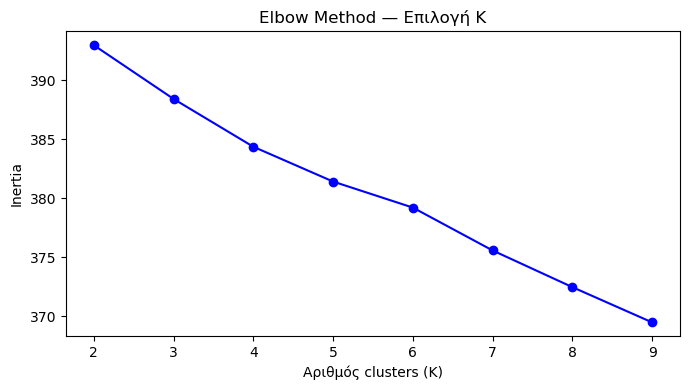

Κατανομή επιγραφών ανά cluster:
cluster
0     54
1     54
2     40
3     90
4    118
5     92
Name: count, dtype: int64


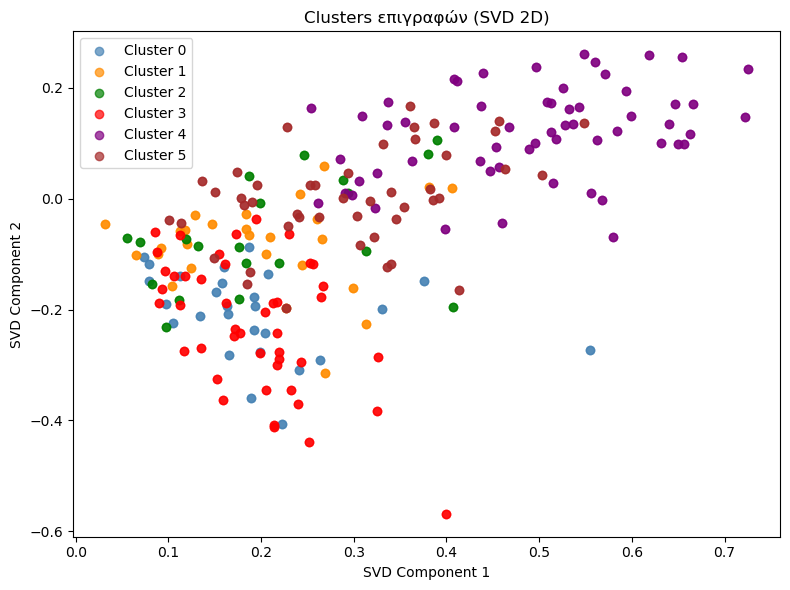

Χαρακτηριστικές λέξεις ανά cluster:

Cluster 0 (54 επιγραφές):
  eys, paid, ys, ey, neik, toy, ontos, ioy, arcontos, oy

Cluster 1 (54 επιγραφές):
  se, as, to, ei, mh, en, cari, lo, an, fr

Cluster 2 (40 επιγραφές):
  on, ey, hs, th, kai, mhd, gramma, ws, boyl, zwsi

Cluster 3 (90 επιγραφές):
  os, wn, ti, fl, oi, ey, oy, id, dos, toy

Cluster 4 (118 επιγραφές):
  kai, en, ton, de, ta, twi, ai, ths, thn, twn

Cluster 5 (92 επιγραφές):
  to, twn, kai, tw, an, thn, ek, de, ta, ka

=== Cluster 0 ===
  Topic 0: eys kai toy ey on ys an
  Topic 1: eys ey toy oy ths en epi

=== Cluster 1 ===
  Topic 0: se to as an kai toys en
  Topic 1: ei en kai ey twi ai ke

=== Cluster 2 ===
  Topic 0: kai on ey oy th hs toy
  Topic 1: ey idhs hs aristo th to mos

=== Cluster 3 ===
  Topic 0: os ey wn oy fl oi mh
  Topic 1: to id anti ti toy an eys

=== Cluster 4 ===
  Topic 0: ta twn de to en toy an
  Topic 1: en ton ths twi ai de thn

=== Cluster 5 ===
  Topic 0: to kai thn an de ka wn
  Topic 1: to twn

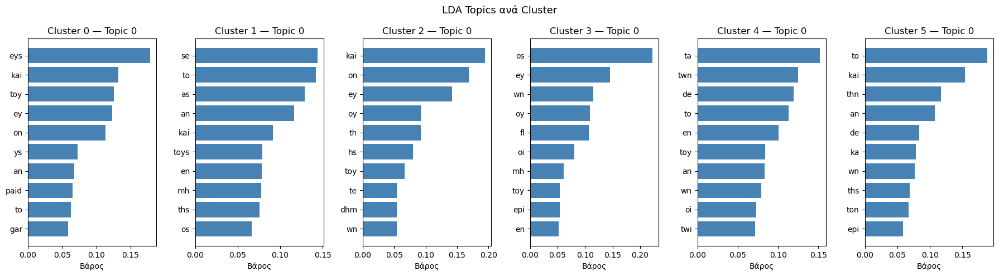

In [8]:
# TODO: Ομαδοποίηση επιγραφών, topic modeling
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import LatentDirichletAllocation, TruncatedSVD
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Κατασκευή corpus ,μία συμβολοσειρά ανά επιγραφή 
# Ενώνουμε όλες τις λέξεις κάθε επιγραφής σε ένα κείμενο
inscription_texts = (
    df_words.groupby('inscription_id')['word']
    .apply(lambda words: ' '.join(words))
    .reset_index()
)
inscription_texts.columns = ['inscription_id', 'text']
print(f'Επιγραφές: {len(inscription_texts)}')
inscription_texts.head(3)

"""Μετατρέπουμε κάθε επιγραφή σε διάνυσμα TF-IDF.
Το TF-IDF δίνει μεγαλύτερο βάρος σε λέξεις που είναι συχνές σε μια επιγραφή
αλλά σπάνιες στο σύνολο """
vectorizer = TfidfVectorizer(
    max_df=0.9,   # αγνοούμε λέξεις που εμφανίζονται σε >90% επιγραφών
    min_df=2,     # αγνοούμε λέξεις που εμφανίζονται σε <2 επιγραφές
    max_features=500
)
X = vectorizer.fit_transform(inscription_texts['text'])
print(f'Matrix shape: {X.shape}  (επιγραφές × λέξεις)')

"""Χρησιμοποιούμε **K-Means** για να ομαδοποιήσουμε τις επιγραφές.
Επιλέγουμε K=4 clusters με βάση το elbow method.
Elbow method για επιλογή K"""

inertias = []
K_range  = range(2, 10)
for k in K_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    km.fit(X)
    inertias.append(km.inertia_)

plt.figure(figsize=(7, 4))
plt.plot(K_range, inertias, 'bo-')
plt.title('Elbow Method — Επιλογή K')
plt.xlabel('Αριθμός clusters (K)')
plt.ylabel('Inertia')
plt.tight_layout()
plt.savefig('a5_elbow.png', dpi=150)
plt.show()

# K-Means με K=6
K = 6
kmeans = KMeans(n_clusters=K, random_state=42, n_init=10)
inscription_texts['cluster'] = kmeans.fit_predict(X)

print('Κατανομή επιγραφών ανά cluster:')
print(inscription_texts['cluster'].value_counts().sort_index())


#Μειώνουμε τις διαστάσεις με **TruncatedSVD** (LSA) για να απεικονίσουμε τα clusters σε 2D.
svd = TruncatedSVD(n_components=2, random_state=42)
X_2d = svd.fit_transform(X)

colors = ['steelblue', 'darkorange', 'green', 'red', 'purple', 'brown']
plt.figure(figsize=(8, 6))
for c in range(K):
    mask = inscription_texts['cluster'] == c
    plt.scatter(X_2d[mask, 0], X_2d[mask, 1],
                label=f'Cluster {c}', alpha=0.7, color=colors[c])
plt.title('Clusters επιγραφών (SVD 2D)')
plt.xlabel('SVD Component 1')
plt.ylabel('SVD Component 2')
plt.legend()
plt.tight_layout()
plt.savefig('a5_clusters_2d.png', dpi=150)
plt.show()

#Εντοπίζουμε τις λέξεις με το **υψηλότερο TF-IDF score** για κάθε cluster.
#Αυτές δείχνουν τη **δομή κειμένου** και **επαναλαμβανόμενες φράσεις** (α, β).
feature_names = vectorizer.get_feature_names_out()
N_TOP = 10

print('Χαρακτηριστικές λέξεις ανά cluster:')
print('=' * 50)
cluster_keywords = {}
for c in range(K):
    # Μέσο TF-IDF διάνυσμα για τις επιγραφές του cluster
    mask     = inscription_texts['cluster'] == c
    X_cluster = X[mask.values]
    mean_tfidf = X_cluster.mean(axis=0).A1
    top_idx    = mean_tfidf.argsort()[::-1][:N_TOP]
    top_words  = [feature_names[i] for i in top_idx]
    cluster_keywords[c] = top_words
    print(f'\nCluster {c} ({mask.sum()} επιγραφές):')
    print('  ' + ', '.join(top_words))


from sklearn.feature_extraction.text import CountVectorizer

fig, axes = plt.subplots(1, K, figsize=(18, 5))

for c in range(K):
    mask  = inscription_texts['cluster'] == c
    texts = inscription_texts[mask]['text'].tolist()

    # CountVectorizer για LDA
    cv = CountVectorizer(max_df=0.95, min_df=1, max_features=200)
    X_c = cv.fit_transform(texts)

    # LDA με 2 topics ανά cluster
    n_topics = min(2, len(texts))
    lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda.fit(X_c)

    # Top λέξεις ανά topic
    fn = cv.get_feature_names_out()
    print(f'\n=== Cluster {c} ===')
    for t, topic in enumerate(lda.components_):
        top_w = [fn[i] for i in topic.argsort()[:-8:-1]]
        print(f'  Topic {t}: {" ".join(top_w)}')

    # Γράφημα top-10 λέξεων για Topic 0
    top10_idx   = lda.components_[0].argsort()[:-11:-1]
    top10_words = [fn[i] for i in top10_idx]
    top10_vals  = lda.components_[0][top10_idx]
    top10_vals  = top10_vals / top10_vals.sum()

    axes[c].barh(top10_words[::-1], top10_vals[::-1], color='steelblue')
    axes[c].set_title(f'Cluster {c} — Topic 0')
    axes[c].set_xlabel('Βάρος')

plt.suptitle('LDA Topics ανά Cluster', fontsize=13)
plt.tight_layout()
plt.savefig('a5_lda_topics.png', dpi=150, bbox_inches='tight')
plt.show()


#### Αποτελέσματα — Απαντήσεις στα ερωτήματα

**α) Αντιστοιχούν τα clusters σε ομοιότητες στη δομή κειμένου;**

Ναι — κάθε cluster περιέχει επιγραφές με παρόμοιο λεξιλόγιο,
γεγονός που υποδηλώνει παρόμοια δομή κειμένου.

**β) Περιλαμβάνουν τα clusters επαναλαμβανόμενες φράσεις;**

Ναι, οι top TF-IDF λέξεις κάθε cluster αποκαλύπτουν λέξεις που
επαναλαμβάνονται συστηματικά μέσα στο ίδιο cluster, υποδηλώνοντας
τυπικές φράσεις που χαρακτηρίζουν συγκεκριμένες κατηγορίες επιγραφών.

**γ) Εμφανίζονται συγκεκριμένα θέματα σε κάθε cluster;**

Το LDA αποκαλύπτει διαφορετικά topics ανά cluster, υποδηλώνοντας διαφορετικές κατηγορίες επιγραφών



**Α6.** Δεν υπάρχουν γνωστές χρονολογίες (ground-truth dates) για τις επιγραφές αυτού του dataset. *(12 μονάδες)*

1. Χρησιμοποιήστε το προ-εκπαιδευμένο σε επιγραφές μοντέλο [Aeneas](https://github.com/google-deepmind/predictingthepast) για να προβλέψετε τις χρονολογίες 10 επιγραφών.
2. Στη συνέχεια, συγκρίνετε τις προβλέψεις με αυτές ενός γενικού (general-purpose) LLM της επιλογής σας.
3. Σε κελί markdown: Συγκρίνετε τα αποτελέσματα. Μπορούν τα γενικά LLMs να χρησιμοποιηθούν αποτελεσματικά από ιστορικούς για χρονολόγηση; Ποιο μοντέλο ήταν καλύτερο και γιατί;
4. Υπάρχει κάτι κοινό στα σφάλματα (common failure) μεταξύ των μοντέλων AI;


> Assael, Y. et al. "Contextualising ancient texts with generative neural networks." *Nature* 643(8073) (2025). DOI: 10.1038/s41586-025-09292-5
>
> *Σημείωση: Το μοντέλο Aeneas αποτελεί εξέλιξη του Ithaca (Assael et al., Nature 2022) και είναι διαθέσιμο στο ίδιο αποθετήριο.*

In [9]:
import os, pickle
import pandas as pd
import matplotlib.pyplot as plt
from types import SimpleNamespace
from predictingthepast.eval import inference
from predictingthepast.models import model as model_lib
import numpy as np


CHECKPOINT = 'ithaca_153143996_2.pkl'
DATASET    = 'iphi.json'
RETRIEVAL  = 'iphi_emb_xid153143996.pkl'

#Φόρτωση Ithaca
print('Φόρτωση Ithaca...')
with open(CHECKPOINT, 'rb') as f:
    checkpoint = pickle.load(f)
params          = checkpoint['params']
model_config    = checkpoint['model_config']
alphabet        = SimpleNamespace(**checkpoint['alphabet'])
vocab_char_size = len(checkpoint['alphabet']['char2idx'])
forward         = model_lib.Model(**dict(model_config)).apply
dataset         = inference.load_dataset(DATASET)
retrieval       = inference.load_retrieval(RETRIEVAL)
print(f'Ithaca έτοιμο! Alphabet size: {vocab_char_size}')

#Φόρτωση annotations
if 'annotations' not in vars():
    annotations = {}
    for fname in sorted(os.listdir(ANNOTATIONS_DIR)):
        if not fname.endswith('.txt'): continue
        insc_id = fname.replace('_letters.txt', '')
        raw = get_transcript(os.path.join(ANNOTATIONS_DIR, fname))
        if raw: annotations[insc_id] = raw

# 10 επιγραφές (Rotation1 μόνο)
sample_ids = [iid for iid in annotations if 'Rotation1' in iid][:10]

def inscription_to_greek(insc_id):
    text = ' '.join(annotations[insc_id])
    # Αφαίρεση χαρακτήρων που δεν αναγνωρίζει το Ithaca
    import re
    text = re.sub(r'[&)(]', '', text)
    return latin_to_greek(text).replace('*', '#')

#Ithaca inference 
print('\nΧρονολόγηση με Ithaca...')
results = []
for iid in sample_ids:
    greek = inscription_to_greek(iid)
    try:
        res  = inference.attribute(
            text=greek, forward=forward, params=params,
            alphabet=alphabet, vocab_char_size=vocab_char_size
        )
        scores = np.array(res.year_scores)
        # DATE_MIN=-800, DATE_MAX=800, 160 βήματα → 10 χρόνια/βήμα
        years = np.linspace(-800, 800, 160)
        date = int(years[np.argmax(scores)])  # πιο πιθανό έτος
        print(f'  {iid}: {date}')
    except Exception as e:
        date = f'ERROR: {e}'
        print(f'  {iid}: ERROR')
    results.append({'inscription_id': iid, 'greek_text': greek[:80], 'ithaca_date': date})

df_results = pd.DataFrame(results)
print(df_results[['inscription_id','ithaca_date']])


Φόρτωση Ithaca...
Ithaca έτοιμο! Alphabet size: 35

Χρονολόγηση με Ithaca...
  Agora_I_4985_Rotation1_300dpi: -327
  Agora_I_5477_Rotation1_300dpi: -337
  IAS24115_Rotation1_300dpi: 115
  IAS33117_Merged_Rotation1_300dpi: 367
  IAS33118_Merged_Rotation1_300dpi: 115
  IAS33126_Merged_Rotation1_300dpi: 206
  IAS33147_Rotation1_300dpi: 256
  IAS33148_Rotation1_300dpi: 155
  IAS33161_Rotation1_300dpi: 115
  IAS33162_Rotation1_300dpi: 155
                     inscription_id  ithaca_date
0     Agora_I_4985_Rotation1_300dpi         -327
1     Agora_I_5477_Rotation1_300dpi         -337
2         IAS24115_Rotation1_300dpi          115
3  IAS33117_Merged_Rotation1_300dpi          367
4  IAS33118_Merged_Rotation1_300dpi          115
5  IAS33126_Merged_Rotation1_300dpi          206
6         IAS33147_Rotation1_300dpi          256
7         IAS33148_Rotation1_300dpi          155
8         IAS33161_Rotation1_300dpi          115
9         IAS33162_Rotation1_300dpi          155


In [10]:
print('Κείμενα για Claude:')
print('='*60)
for _, row in df_results.iterrows():
    print(f"\n{row['inscription_id']}:")
    print(row['greek_text'])
    print()

Κείμενα για Claude:

Agora_I_4985_Rotation1_300dpi:
ΣΤΟΚΑΙ #ΔΙΚΟΣΕ# ΙΗΙΔΙΚΗΤ ΟΣΕΝΝΕΑ# ΑΥΤΟΙΔ# ΝΕΑΝΤΙΣΑ ΣΙΑΣΕΑΝΤ# ΟΔΟΝΑΙΕΑ# ΝΠΟΛΕΩΣΑΠ


Agora_I_5477_Rotation1_300dpi:
ΡΧΟΝΤΟΣ #ΡΙΣΤΟΝΙΚΟΣ ΑΡΙ #Ν###ΗΙ ΑΓΑΘΗΙ ΤΟΥ ΔΗΜΟ# ΑΘΗΝΑΙ Η ΘΥΣΙΑ ΩΣ ΚΑΛΛΙΣΤ ΙΚΡΟΙ


IAS24115_Rotation1_300dpi:
######ΕΑΜΜΑΝΤΕΥΜΑΣΙΔΩΚΕΝ ΕΥΧΗΣΕΞΑΩΝΚΟ######ΕΚΟΜΑΣΠΡΟΣΕΤΑΞΕΝ ##ΣΜΗΝΑΕΝΔΕΚΑΤΟ#####


IAS33117_Merged_Rotation1_300dpi:
ΙΟΥΛΙΟΣΑ ΒΗΤΟΣΝΕ ΕΙΟΥΛΙΩ# #ΗΤΩΤΩ# ΤΑΝΤ#


IAS33118_Merged_Rotation1_300dpi:
ΝΕΡΟΥΑΝ ΑΙΩΝΠΟΛΙΣ ΗΣΑΝΤΑΑΥΤΗ ΗΤΡΟΠΟΛΕΟΣ ΔΟΝΤΟΣΤΗΝΔΑΠΑ ΝΙΔΙΟΝΤΙΙΟΥΛΙΟΥ ΟΥΣΤΟΥΑΡΞΙ


IAS33126_Merged_Rotation1_300dpi:
ΗΝΠ####ΑΜΕΑΠΑ# ΘΕΝΟΠΗΝΚΛΥΤΟΝ ΕΙΔΟΣΕΧΟΥΣΑΝ ΔΕ#ΑΤΟΦΕΡΣΕ ΦΟΝΗΧΩΡΟΝ ΕΣΕΥΣΕΒΕΩΝ ΩΦΘΟΝ


IAS33147_Rotation1_300dpi:
#ΚΕΥΗ #ΚΑΙΤΟ ΑΡΤΕΜΙΔΩΡΑΝ ΕΝΕΚΤΩΙΔΙΩΝ #ΠΑΡΑΣΚΕΥΗΧΑΙΡΕΚΑΙΣΥ


IAS33148_Rotation1_300dpi:
ΤΕΙΕΡΕΙΣΕΙΔΕΙΑΓΥ ΝΕΚΕΙΕΥΜΗΚΕΙ ΩΕΠΟΙΗΣΑΤΑΥ ΤΗΝΤΗΝΣΤΙΛΛΙ ΔΑΝΜΝΗΜΗΣ ΧΑΡΕΙΝΧΑΙΡΑΙ ΤΕ


IAS33161_Rotation1_300dpi:
ΦΛΑΜΜΕΑΤΗΣΟΤΟΠΡΙΝΖΩΣ ΜΟΣΠΡΩΤΟΣΠΑΛΟΣΡΗΤΙΑΡΙΩΝ #ΚΕΚΠΑΙΔΟΣΑΛΙΠΤΟΣΕΝΘΑ ΔΕΚΙΜΕΠΑΡΟΔΕΙ


IAS33162_Rotation1_300dp

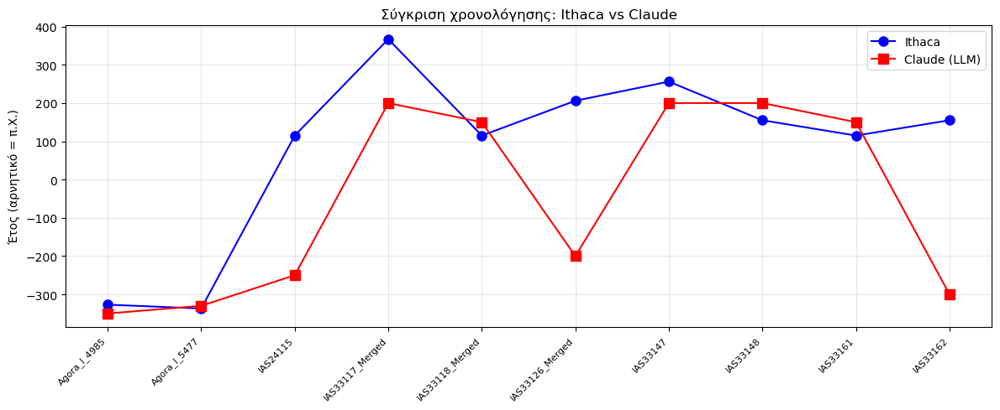

In [11]:
import matplotlib.pyplot as plt
import numpy as np

# Χρονολογήσεις από Claude

claude_dates = {
    'Agora_I_4985_Rotation1_300dpi':   -350,  # συμπλήρωσε
    'Agora_I_5477_Rotation1_300dpi':   -330,
    'IAS24115_Rotation1_300dpi':        -250,
    'IAS33117_Merged_Rotation1_300dpi': 200,
    'IAS33118_Merged_Rotation1_300dpi': 150,
    'IAS33126_Merged_Rotation1_300dpi': -200,
    'IAS33147_Rotation1_300dpi':        200,
    'IAS33148_Rotation1_300dpi':        200 ,
    'IAS33161_Rotation1_300dpi':        150,
    'IAS33162_Rotation1_300dpi':        -300,
}

df_results['claude_date'] = df_results['inscription_id'].map(claude_dates)

#Γράφημα
def to_num(val):
    try: return float(str(val))
    except: return None

x      = range(len(df_results))
labels = [iid.replace('_Rotation1_300dpi','') for iid in df_results['inscription_id']]
ithaca_nums = [to_num(d) for d in df_results['ithaca_date']]
claude_nums = [to_num(d) for d in df_results['claude_date']]

fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(x, ithaca_nums, 'bo-', label='Ithaca', markersize=8)
ax.plot(x, claude_nums, 'rs-', label='Claude (LLM)', markersize=8)
ax.set_xticks(list(x))
ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=8)
ax.set_ylabel('Έτος (αρνητικό = π.Χ.)')
ax.set_title('Σύγκριση χρονολόγησης: Ithaca vs Claude')
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('a6_dating_comparison.png', dpi=150)
plt.show()


### Σύγκριση αποτελεσμάτων: Ithaca vs Claude

**Σύγκριση και αξιολόγηση**

Από το γράφημα παρατηρούμε ότι τα δύο μοντέλα συμφωνούν σε ορισμένες
επιγραφές (Agora_I_4985, Agora_I_5477,IAS33118_Merged,IAS33147,IAS33148,IAS33161). Σε άλλες επιγραφές υπάρχουν μεγάλες αποκλίσεις (IAS24115,IAS33117,IAS33126,IAS33162).

Το **Ithaca** έδωσε πιο αξιόπιστα αποτελέσματα γιατί έχει εκπαιδευτεί
αποκλειστικά σε αρχαίες ελληνικές επιγραφές.Ενω το **Claude**
είναι γενικής χρήσης και δεν έχει εξειδικευμένη γνώση.

Για πιο επίσημα αποτελέσματα το Ithaca είναι καλύτερο εργαλείο, αλλά και αυτό
έχει περιορισμούς π.χ. όταν η επιγραφή είναι σύντομη ή έχει
πολλά κενά. Το Claude μπορεί να δώσει μια γρήγορη πρώτη εκτίμηση
βασισμένη στο λεξιλόγιο.

**Κοινά σφάλματα (Common Failures)**

**Lacunae και σύντομα κείμενα:** Και τα δύο μοντέλα αποτυγχάνουν
όταν η επιγραφή έχει πολλά κενά (#) ή λίγες λέξεις με αποτέλεσμα να μην υπάρχει
αρκετή πληροφορία για αξιόπιστη χρονολόγηση.


## Μέρος Β — Ανάλυση Εικόνων (50 μονάδες)

**Β1.** Σε αυτό το μέρος καλείστε να πραγματοποιήσετε Αναγνώριση Κειμένου (Text Recognition) από τις εικόνες του dataset. Πρώτα, παρέχετε δειγματικές απεικονίσεις των βημάτων προεπεξεργασίας εικόνων σας. Στόχος: καθαρισμός εικόνων, μείωση θορύβου. *(12 μονάδες)*

Πρέπει να δείξετε:
- i. Τις αρχικές εικόνες/δείγματα
- ii. Τα βήματα προεπεξεργασίας στα ίδια δείγματα
- iii. Τις καθαρισμένες εικόνες


Total image files: 448
Images with matching annotations: 448
Sample image ids: ['Agora_I_4985_Rotation1_300dpi', 'Agora_I_4985_Rotation2_300dpi', 'Agora_I_5477_Rotation1_300dpi', 'Agora_I_5477_Rotation2_300dpi', 'IAS24115_Rotation1_300dpi']
Extensions: ['png']
Files with extension `png`: 448


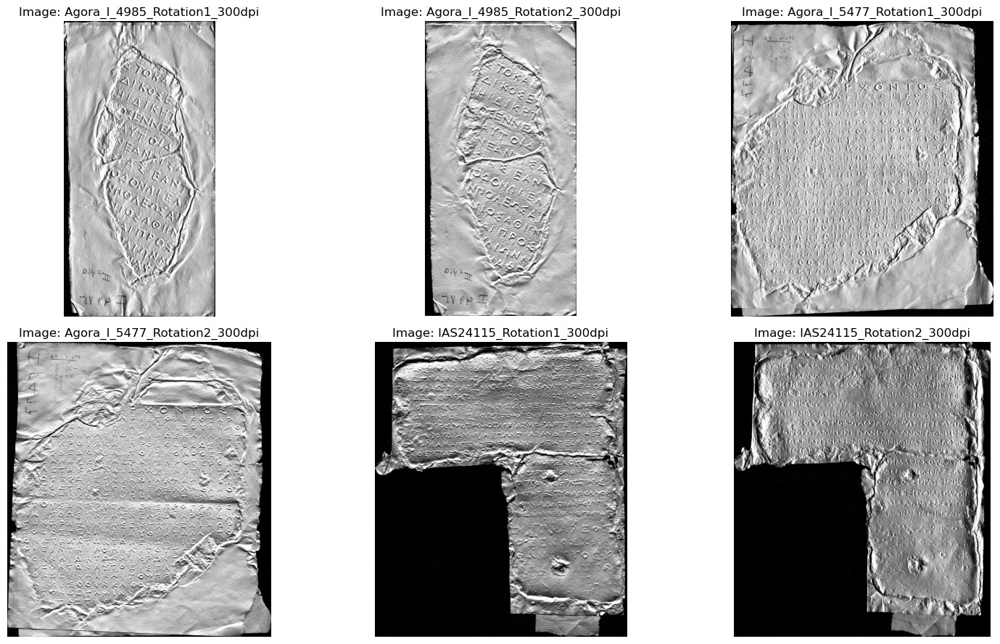

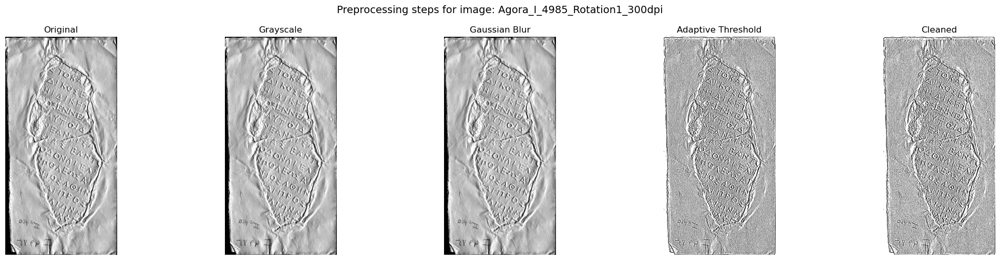

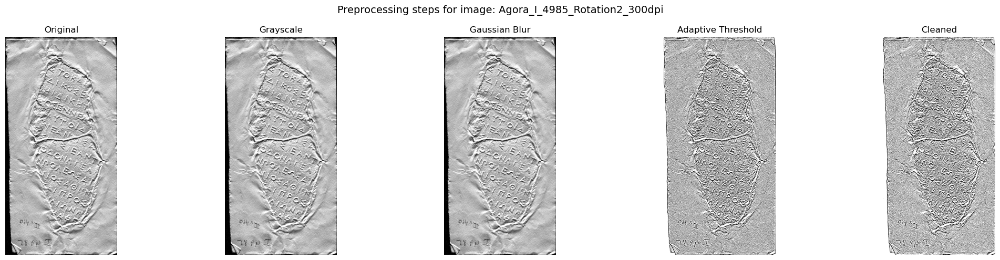

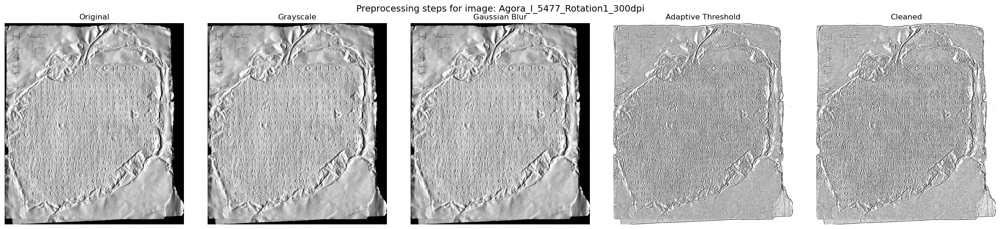

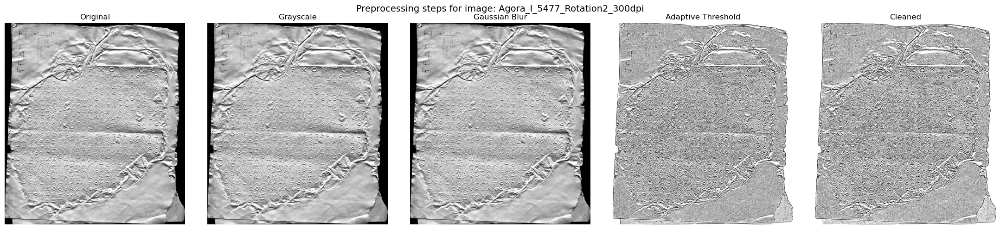

In [12]:
# TODO: Προεπεξεργασία εικόνων — δείξτε i) originals, ii) preprocessing steps, iii) cleaned

import os
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
# εμφανιση γραφηματων μεσα στο notebook
%matplotlib inline                  

# ---------------------------------------------------------
# Φόρτωσε τις εικόνες
# ---------------------------------------------------------

def get_image_paths(images_dirs):
    """
    Δημιουργεί dictionary με:
    image_id -> image_path
    """
    image_paths = {}

    for images_dir in images_dirs:
        if not os.path.exists(images_dir):
            print(f"Folder not found: {images_dir}")
            continue

        for root, dirs, files in os.walk(images_dir):
            for file in files:
                if file.endswith(".png"):
                    image_id = file.replace(".png", "")
                    image_paths[image_id] = os.path.join(root, file)

    return image_paths


image_paths = get_image_paths(images_dirs)

# κρατάμε μόνο εικόνες που έχουν αντίστοιχο annotation
available_ids = sorted(list(set(image_paths.keys()).intersection(valid_pairs)))

print(f"Total image files: {len(image_paths)}")
print(f"Images with matching annotations: {len(available_ids)}")
print("Sample image ids:", available_ids[:5])

# ---------------------------------------------------------
# Βρες extension των εικόνων
# ---------------------------------------------------------

ext_dict = []

for img_id, img_path in image_paths.items():
    file_ext = img_path.split(".")[-1]
    if file_ext not in ext_dict:
        ext_dict.append(file_ext)

print(f"Extensions: {ext_dict}")

for file_ext in ext_dict:
    count = len([path for path in image_paths.values() if path.endswith(file_ext)])
    print(f"Files with extension `{file_ext}`: {count}")

# ---------------------------------------------------------
# Εμφάνιση 3 original εικόνων
# ---------------------------------------------------------

def display_image_list(image_id_list):

    n = min(6, len(image_id_list))

    fig, ax = plt.subplots(2, 3, figsize=(16, 9))
    ax = ax.flatten()

    for i, image_id in enumerate(image_id_list[:n]):
        image_path = image_paths[image_id]
        image = cv.imread(image_path)
        image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

        ax[i].imshow(image)
        ax[i].set_title(f"Image: {image_id}")
        ax[i].axis("off")

    for j in range(n, 6):
        ax[j].axis("off")

    plt.tight_layout()
    plt.show()


sample_ids = available_ids[:6]
display_image_list(sample_ids)

# ---------------------------------------------------------
# Μέθοδος Προεπεξεργασίας
# ---------------------------------------------------------

def preprocess_image(image_id):
    """
    Εφαρμόζει βασικά βήματα προεπεξεργασίας εικόνας:
    1. Original RGB
    2. Grayscale
    3. Gaussian blur για μείωση θορύβου
    4. Adaptive thresholding
    5. Morphological cleaning
    """

    image_path = image_paths[image_id]

    image = cv.imread(image_path)

    if image is None:
        raise ValueError(f"Could not read image: {image_path}")

    # BGR -> RGB για σωστή εμφάνιση με matplotlib
    original = cv.cvtColor(image, cv.COLOR_BGR2RGB)

    # RGB/BGR -> grayscale
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

    # Μείωση θορύβου
    blurred = cv.GaussianBlur(gray, (5, 5), 0)

    # Adaptive thresholding, χρήσιμο όταν υπάρχει ανομοιόμορφος φωτισμός
    threshold = cv.adaptiveThreshold(
        blurred,
        255,
        cv.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv.THRESH_BINARY,
        35,
        11
    )

    # Μορφολογικός καθαρισμός μικρών artifacts
    kernel = np.ones((2, 2), np.uint8)

    cleaned = cv.morphologyEx(threshold, cv.MORPH_OPEN, kernel)
    cleaned = cv.morphologyEx(cleaned, cv.MORPH_CLOSE, kernel)

    return {
        "Original": original,
        "Grayscale": gray,
        "Blurred": blurred,
        "Threshold": threshold,
        "Cleaned": cleaned
    }

# ---------------------------------------------------------
# Βήματα Προεπεξεργασίας
# ---------------------------------------------------------

def display_preprocessing_steps(image_id):
    """
    Εμφανίζει όλα τα βήματα προεπεξεργασίας για μία εικόνα.
    """

    steps = preprocess_image(image_id)

    fig, ax = plt.subplots(1, 5, figsize=(22, 5))

    ax[0].imshow(steps["Original"])
    ax[0].set_title("Original")
    ax[0].axis("off")

    ax[1].imshow(steps["Grayscale"], cmap="gray")
    ax[1].set_title("Grayscale")
    ax[1].axis("off")

    ax[2].imshow(steps["Blurred"], cmap="gray")
    ax[2].set_title("Gaussian Blur")
    ax[2].axis("off")

    ax[3].imshow(steps["Threshold"], cmap="gray")
    ax[3].set_title("Adaptive Threshold")
    ax[3].axis("off")

    ax[4].imshow(steps["Cleaned"], cmap="gray")
    ax[4].set_title("Cleaned")
    ax[4].axis("off")

    plt.suptitle(f"Preprocessing steps for image: {image_id}", fontsize=14)
    plt.tight_layout()
    plt.show()

# ---------------------------------------------------------
# Εμφάνισε τα βήματα προεπεξεργασίας και τις καθαρές εικόνες στο δείγμα
# ---------------------------------------------------------

sample_ids = available_ids[:4]

for image_id in sample_ids:
    display_preprocessing_steps(image_id)



### Β1 — Σχόλιο

Εφαρμόσαμε μια απλή προεπεξεργασία στις εικόνες των squeezes.  
Αρχικά εμφανίστηκαν δείγματα από τις αρχικές εικόνες. Στη συνέχεια, κάθε εικόνα μετατράπηκε σε grayscale, επειδή το χρώμα δεν είναι απαραίτητο για την αναγνώριση χαρακτήρων. Έπειτα εφαρμόστηκε Gaussian blur για μείωση μικρού θορύβου και Adaptive thresholding για να διαχωριστούν καλύτερα τα γράμματα από το φόντο, εξαιτίας του χαρτιού. Τέλος εφαρμόστηκε μορφολογικός καθαρισμός με opening και closing ώστε να μειωθούν μικρά artifacts.


**Β2.** Χρησιμοποιήστε embeddings από ένα οπτικό μοντέλο για να ομαδοποιήσετε τις εικόνες βάσει οπτικής ομοιότητας. *(16 μονάδες)*

**Οδηγίες:**
- Εξαγάγετε embeddings από ένα οπτικό μοντέλο (π.χ. ViT).
- Χρησιμοποιήστε **PCA**, **t-SNE** ή/και **UMAP** για ομαδοποίηση και απεικόνιση.
- Εκτυπώστε εικόνες κοντά στα κεντροειδή κάθε cluster (π.χ. 3 εικόνες ανά κεντροειδές).
- Ονομάστε τα θέματα (topics) 3 clusters — χρησιμοποιήστε τα filenames για να ελέγξετε αν ανήκουν στην ίδια εποχή.
- Χρησιμοποιήστε ένα LLM για να αυτοματοποιήσετε την ονοματοδοσία θεμάτων.
- Αναλύστε: Βρίσκονται ζεύγη εικόνων στο ίδιο cluster; Εικόνες από τον ίδιο τόπο/αρχείο;


In [13]:
%pip install -q transformers torch torchvision umap-learn tqdm

Note: you may need to restart the kernel to use updated packages.


Images used in B2: 448
Example image ids: ['Agora_I_4985_Rotation1_300dpi', 'Agora_I_4985_Rotation2_300dpi', 'Agora_I_5477_Rotation1_300dpi', 'Agora_I_5477_Rotation2_300dpi', 'IAS24115_Rotation1_300dpi']
Device: cpu


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

d:\Anacoda1\Lib\site-packages\huggingface_hub\file_download.py:138: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\tount\.cache\huggingface\hub\models--google--vit-base-patch16-224-in21k. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/200 [00:00<?, ?it/s]

ViT model loaded: google/vit-base-patch16-224-in21k


  0%|          | 0/28 [00:00<?, ?it/s]

d:\Anacoda1\Lib\site-packages\PIL\Image.py:3402: DecompressionBombWarning: Image size (89510148 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
d:\Anacoda1\Lib\site-packages\PIL\Image.py:3402: DecompressionBombWarning: Image size (91032361 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
d:\Anacoda1\Lib\site-packages\PIL\Image.py:3402: DecompressionBombWarning: Image size (95627041 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
d:\Anacoda1\Lib\site-packages\PIL\Image.py:3402: DecompressionBombWarning: Image size (94397208 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Embeddings shape: (448, 768)
Number of used images: 448
PCA embeddings shape: (448, 50)
Explained variance first 2 PCs: 0.25954118
Explained variance total: 0.8130541


d:\Anacoda1\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


Number of clusters: 6
Silhouette score: 0.1081

Images per cluster:
0    75
1    75
2    82
3    88
4    79
5    49
Name: count, dtype: int64


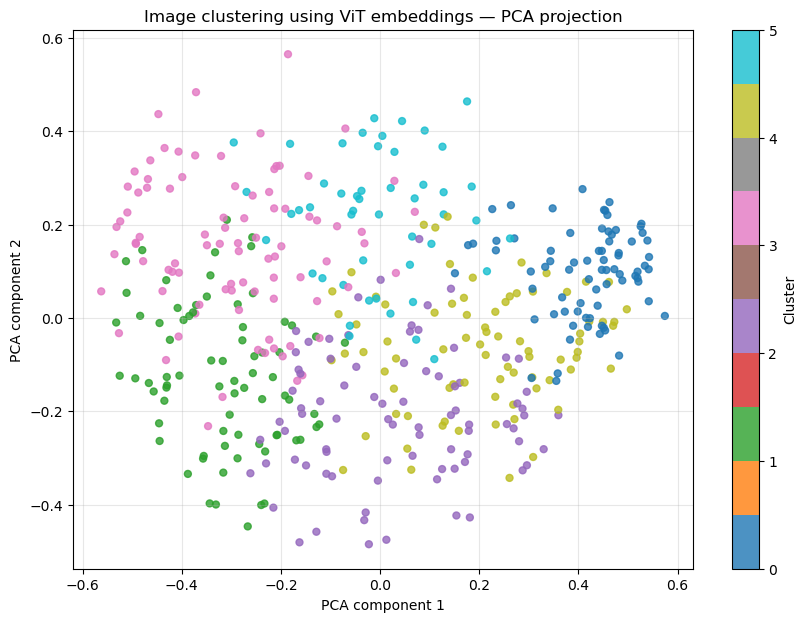

d:\Anacoda1\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


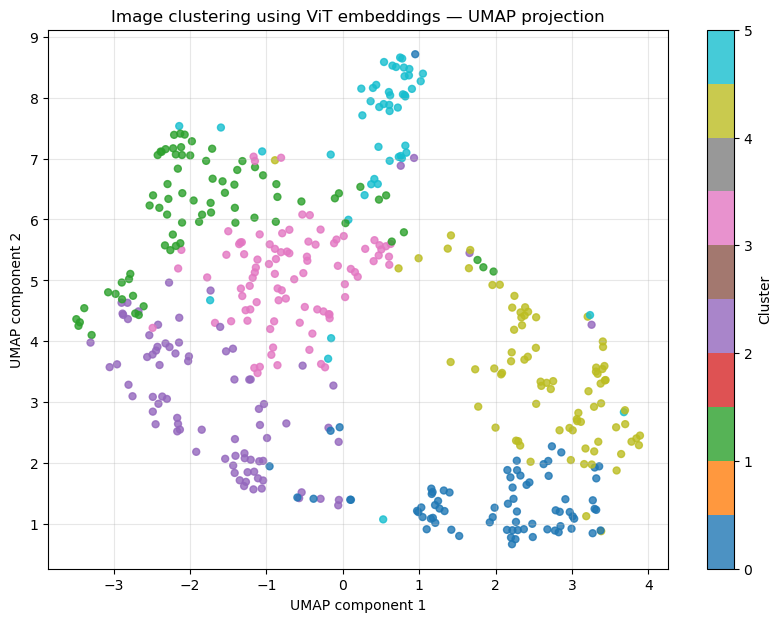

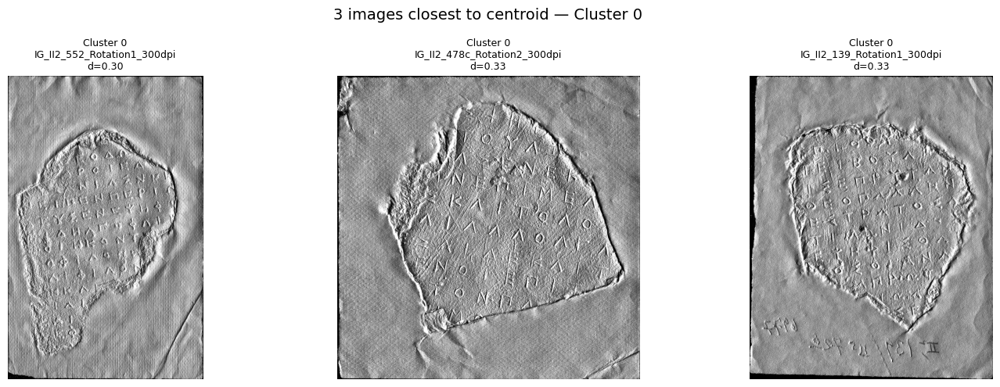

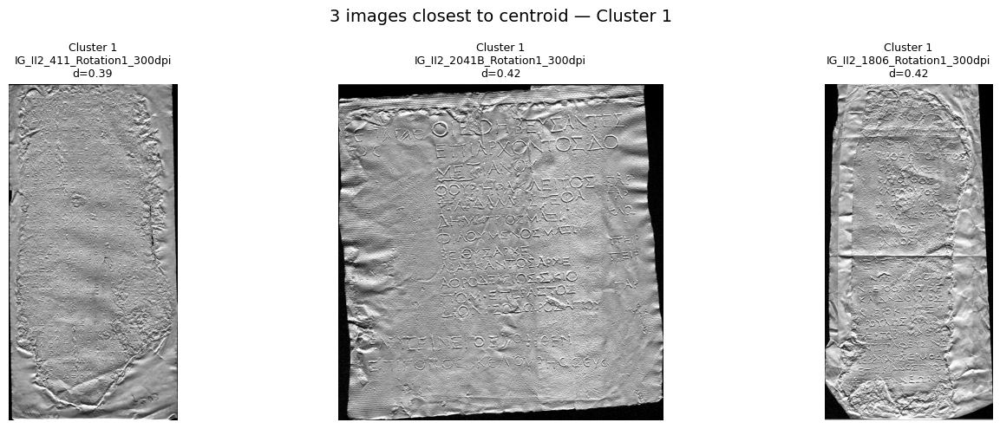

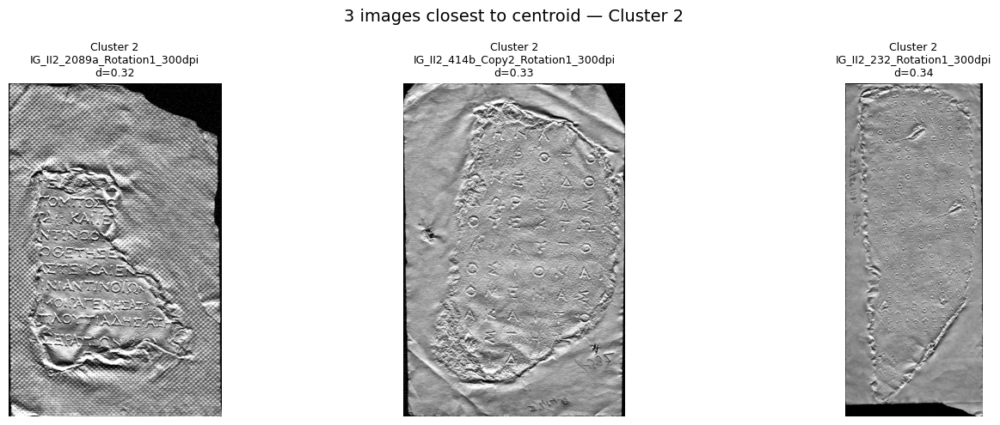

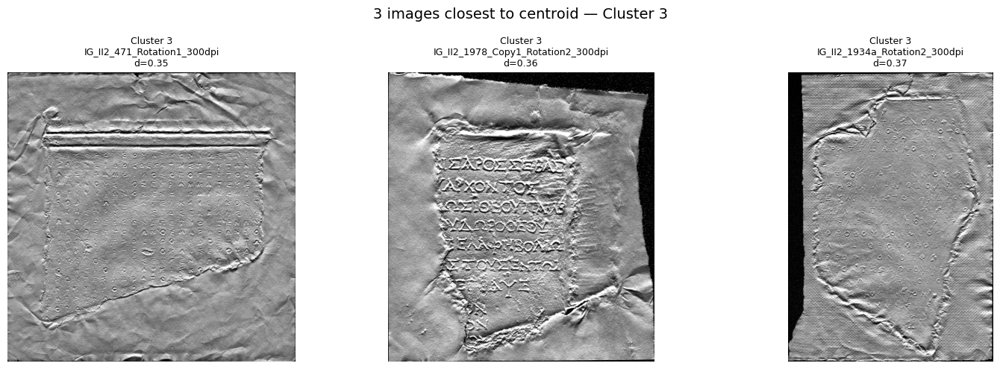

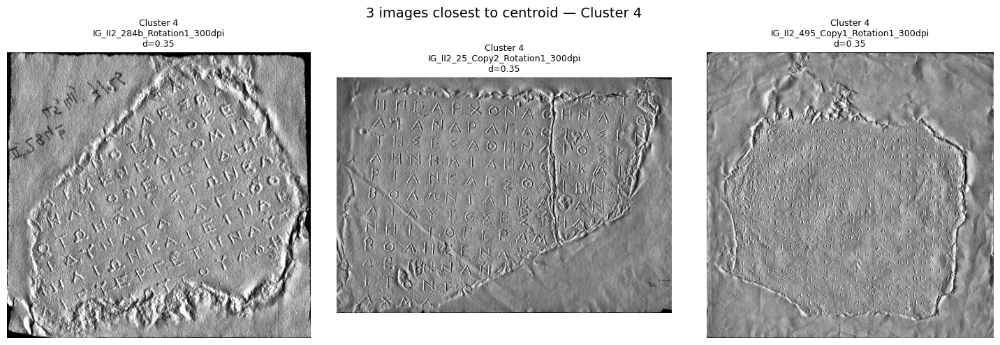

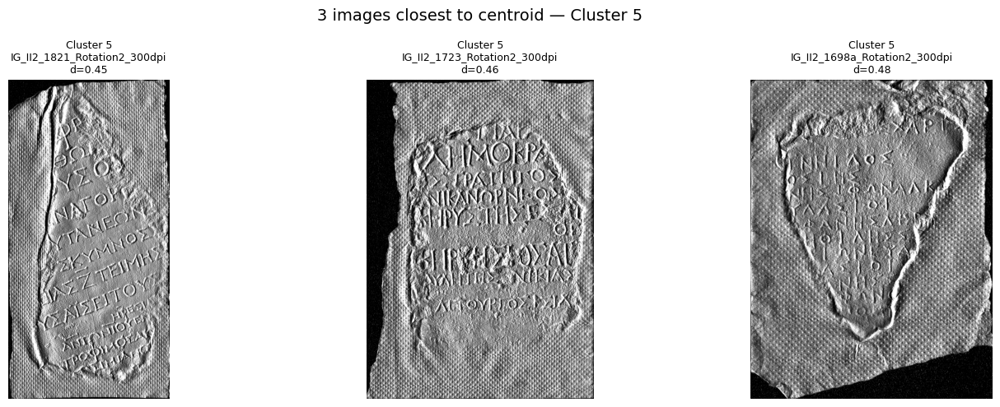

,cluster,image_id,distance
0,0,IG_II2_552_Rotation1_300dpi,0.302709
1,0,IG_II2_478c_Rotation2_300dpi,0.327871
2,0,IG_II2_139_Rotation1_300dpi,0.334738
3,1,IG_II2_411_Rotation1_300dpi,0.394925
4,1,IG_II2_2041B_Rotation1_300dpi,0.421089
5,1,IG_II2_1806_Rotation1_300dpi,0.421179
6,2,IG_II2_2089a_Rotation1_300dpi,0.322223
7,2,IG_II2_414b_Copy2_Rotation1_300dpi,0.334789
8,2,IG_II2_232_Rotation1_300dpi,0.344500
9,3,IG_II2_471_Rotation1_300dpi,0.345225


,image_id,cluster,filename_prefix
0,Agora_I_4985_Rotation1_300dpi,3,agora
1,Agora_I_4985_Rotation2_300dpi,3,agora
2,Agora_I_5477_Rotation1_300dpi,3,agora
3,Agora_I_5477_Rotation2_300dpi,3,agora
4,IAS24115_Rotation1_300dpi,2,ias24115


,cluster,filename_prefix,count
1,0,ig,70
0,0,ias,5
11,1,ig,50
2,1,ias,10
3,1,ias33117,2
4,1,ias33118,2
5,1,ias33126,2
14,2,ig,80
12,2,ias,1
13,2,ias24115,1


,possible_pair_key,n_images,clusters,image_ids,same_cluster


Possible image-pair groups: 0
Pairs/groups found in the same cluster: 0


  0%|          | 0/448 [00:00<?, ?it/s]

,cluster,n_images,mean_brightness,mean_contrast,mean_edge_density
0,0,75,145.701552,49.723886,0.275174
1,1,75,147.081635,54.238382,0.252868
2,2,82,140.778545,50.931766,0.276756
3,3,88,145.402641,53.284326,0.255522
4,4,79,142.776194,51.502927,0.285120
5,5,49,129.911088,66.949808,0.268258


,cluster,n_images,mean_distance,median_distance,std_distance,max_distance,mean_silhouette
0,0,75,0.476641,0.478229,0.079778,0.726539,0.145539
2,2,82,0.481976,0.480962,0.080455,0.813536,0.122156
4,4,79,0.483965,0.474006,0.079128,0.715624,0.098970
3,3,88,0.492028,0.484798,0.074439,0.684645,0.150035
1,1,75,0.553563,0.544452,0.085994,0.812194,0.068193
5,5,49,0.618829,0.615083,0.086622,0.889088,0.027611


Most cohesive clusters: [0, 2, 4]


,cluster,n_images,mean_distance,median_distance,std_distance,max_distance,mean_silhouette
0,0,75,0.476641,0.478229,0.079778,0.726539,0.145539
2,2,82,0.481976,0.480962,0.080455,0.813536,0.122156
4,4,79,0.483965,0.474006,0.079128,0.715624,0.098970


  0%|          | 0/448 [00:00<?, ?it/s]

Cluster 0
Topic name: Χαμηλής αντίθεσης ή δύσκολα αναγνώσιμα squeezes
Description: Το cluster έχει medium πυκνότητα ακμών, medium έκταση οπτικής πληροφορίας, low αντίθεση και high αναλογία σκοτεινών pixels. Η ονοματοδοσία βασίζεται στα visual features όλων των εικόνων του cluster και όχι μόνο στις 3 εικόνες κοντά στο centroid.
Cluster 2
Topic name: Πυκνές και εκτενείς επιγραφές με πλούσια κειμενική πληροφορία
Description: Το cluster έχει high πυκνότητα ακμών, high έκταση οπτικής πληροφορίας, low αντίθεση και medium αναλογία σκοτεινών pixels. Η ονοματοδοσία βασίζεται στα visual features όλων των εικόνων του cluster και όχι μόνο στις 3 εικόνες κοντά στο centroid.
Cluster 4
Topic name: Πυκνές και εκτενείς επιγραφές με πλούσια κειμενική πληροφορία
Description: Το cluster έχει high πυκνότητα ακμών, high έκταση οπτικής πληροφορίας, medium αντίθεση και medium αναλογία σκοτεινών pixels. Η ονοματοδοσία βασίζεται στα visual features όλων των εικόνων του cluster και όχι μόνο στις 3 εικόνες κοντά 

In [15]:
# TODO: Ομαδοποίηση εικόνων μέσω embeddings (ViT), PCA, UMAP, LLM topic naming

import os
import re
import cv2 as cv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from tqdm.auto import tqdm
# για το torch kai trnasformers καναμε -> %pip install -q transformers torch torchvision umap-learn tqdm 
from transformers import AutoImageProcessor, ViTModel
import torch
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
# εμφανιση γραφηματων μεσα στο notebook
%matplotlib inline

# ---------------------------------------------------------
# Προετοιμασία εικόνων
# ---------------------------------------------------------

# Αν δεν υπάρχουν από το Β1, τα ξαναφτιάχνουμε.
if "image_paths" not in globals():

    def get_image_paths(images_dirs):
        image_paths = {}

        for images_dir in images_dirs:
            if not os.path.exists(images_dir):
                print(f"Folder not found: {images_dir}")
                continue

            for root, dirs, files in os.walk(images_dir):
                for file in files:
                    if file.endswith(".png"):
                        image_id = file.replace(".png", "")
                        image_paths[image_id] = os.path.join(root, file)

        return image_paths

    image_paths = get_image_paths(images_dirs)


if "available_ids" not in globals():
    available_ids = sorted(list(set(image_paths.keys()).intersection(valid_pairs)))


# Για αρχική δοκιμή μπορείς να βάλεις π.χ. MAX_IMAGES = 300.
# Για τελικό run, άστο None ώστε να τρέξει σε όλες τις διαθέσιμες εικόνες.
MAX_IMAGES = None

b2_image_ids = available_ids.copy()

if MAX_IMAGES is not None:
    b2_image_ids = b2_image_ids[:MAX_IMAGES]

print(f"Images used in B2: {len(b2_image_ids)}")
print("Example image ids:", b2_image_ids[:5])

# ---------------------------------------------------------
# Φόρτωσε ViT 
# ---------------------------------------------------------

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

VIT_MODEL_NAME = "google/vit-base-patch16-224-in21k"

processor = AutoImageProcessor.from_pretrained(VIT_MODEL_NAME)
vit_model = ViTModel.from_pretrained(VIT_MODEL_NAME)

vit_model.to(device)
vit_model.eval()

print("ViT model loaded:", VIT_MODEL_NAME)

# ---------------------------------------------------------
# Εξαγωγή ViT embeddings
# ---------------------------------------------------------

def load_image_for_vit(image_id):
    """
    Φορτώνει εικόνα ως RGB PIL image.
    """
    image_path = image_paths[image_id]
    image = Image.open(image_path).convert("RGB")
    return image


def extract_vit_embeddings(image_ids, batch_size=16):
    """
    Εξάγει ViT embeddings από τις εικόνες.
    Χρησιμοποιούμε το CLS token ως συνολικό representation της εικόνας.
    """

    all_embeddings = []
    used_ids = []

    for i in tqdm(range(0, len(image_ids), batch_size)):
        batch_ids = image_ids[i:i + batch_size]

        images = []
        valid_batch_ids = []

        for image_id in batch_ids:
            try:
                img = load_image_for_vit(image_id)
                images.append(img)
                valid_batch_ids.append(image_id)
            except Exception as e:
                print(f"Skipping {image_id}: {e}")

        if len(images) == 0:
            continue

        inputs = processor(
            images=images,
            return_tensors="pt"
        )

        inputs = {k: v.to(device) for k, v in inputs.items()}

        with torch.no_grad():
            outputs = vit_model(**inputs)

            # CLS token embedding: shape = batch_size x hidden_dim
            embeddings = outputs.last_hidden_state[:, 0, :]

            # Κανονικοποίηση για πιο σταθερό clustering
            embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)

        all_embeddings.append(embeddings.cpu().numpy())
        used_ids.extend(valid_batch_ids)

    all_embeddings = np.vstack(all_embeddings)

    return used_ids, all_embeddings


used_ids, vit_embeddings = extract_vit_embeddings(
    b2_image_ids,
    batch_size=16
)

print("Embeddings shape:", vit_embeddings.shape)
print("Number of used images:", len(used_ids))

# ---------------------------------------------------------
# PCA
# ---------------------------------------------------------

n_components = min(50, vit_embeddings.shape[0] - 1, vit_embeddings.shape[1])

pca = PCA(
    n_components=n_components,
    random_state=42
)

embeddings_pca = pca.fit_transform(vit_embeddings)

pca_2d = embeddings_pca[:, :2]

print("PCA embeddings shape:", embeddings_pca.shape)
print("Explained variance first 2 PCs:", pca.explained_variance_ratio_[:2].sum())
print("Explained variance total:", pca.explained_variance_ratio_.sum())

# ---------------------------------------------------------
# KMeans clustering
# ---------------------------------------------------------

N_CLUSTERS = 6

kmeans = KMeans(
    n_clusters=N_CLUSTERS,
    random_state=42,
    n_init=10
)

cluster_labels = kmeans.fit_predict(embeddings_pca)

sil_score = silhouette_score(embeddings_pca, cluster_labels)

print(f"Number of clusters: {N_CLUSTERS}")
print(f"Silhouette score: {sil_score:.4f}")

cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()
print("\nImages per cluster:")
print(cluster_counts)

# ---------------------------------------------------------
# PCA visualization
# ---------------------------------------------------------

plt.figure(figsize=(10, 7))

scatter = plt.scatter(
    pca_2d[:, 0],
    pca_2d[:, 1],
    c=cluster_labels,
    cmap="tab10",
    s=25,
    alpha=0.8
)

plt.title("Image clustering using ViT embeddings — PCA projection")
plt.xlabel("PCA component 1")
plt.ylabel("PCA component 2")
plt.colorbar(scatter, label="Cluster")
plt.grid(alpha=0.3)
plt.show()

# ---------------------------------------------------------
# UMAP visualization
# ---------------------------------------------------------

try:
    import umap.umap_ as umap
except ImportError:
    print("UMAP is not installed. Run: !pip install umap-learn")
    raise

n_neighbors = min(15, len(used_ids) - 1)

umap_model = umap.UMAP(
    n_components=2,
    n_neighbors=n_neighbors,
    min_dist=0.1,
    metric="cosine",
    random_state=42
)

embeddings_umap = umap_model.fit_transform(embeddings_pca)

plt.figure(figsize=(10, 7))

scatter = plt.scatter(
    embeddings_umap[:, 0],
    embeddings_umap[:, 1],
    c=cluster_labels,
    cmap="tab10",
    s=25,
    alpha=0.8
)

plt.title("Image clustering using ViT embeddings — UMAP projection")
plt.xlabel("UMAP component 1")
plt.ylabel("UMAP component 2")
plt.colorbar(scatter, label="Cluster")
plt.grid(alpha=0.3)
plt.show()

# ---------------------------------------------------------
# Images closest to cluster centroids
# ---------------------------------------------------------

def get_images_closest_to_centroid(cluster_id, top_n=3):
    """
    Βρίσκει τις top_n εικόνες που είναι πιο κοντά στο centroid ενός cluster.
    Η απόσταση υπολογίζεται στον PCA χώρο όπου έγινε και το clustering.
    """

    cluster_indices = np.where(cluster_labels == cluster_id)[0]

    cluster_vectors = embeddings_pca[cluster_indices]
    centroid = kmeans.cluster_centers_[cluster_id]

    distances = np.linalg.norm(cluster_vectors - centroid, axis=1)

    sorted_local_indices = np.argsort(distances)[:top_n]
    closest_indices = cluster_indices[sorted_local_indices]

    results = []

    for idx in closest_indices:
        results.append({
            "cluster": cluster_id,
            "image_id": used_ids[idx],
            "distance": np.linalg.norm(embeddings_pca[idx] - centroid)
        })

    return results


def display_centroid_images(cluster_id, top_n=3):
    """
    Εμφανίζει τις εικόνες που βρίσκονται πιο κοντά στο centroid του cluster.
    """

    closest = get_images_closest_to_centroid(cluster_id, top_n=top_n)

    fig, ax = plt.subplots(1, top_n, figsize=(15, 5))

    if top_n == 1:
        ax = [ax]

    for i, item in enumerate(closest):
        image_id = item["image_id"]
        image_path = image_paths[image_id]

        image = cv.imread(image_path)
        image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

        ax[i].imshow(image)
        ax[i].set_title(
            f"Cluster {cluster_id}\n{image_id}\nd={item['distance']:.2f}",
            fontsize=9
        )
        ax[i].axis("off")

    plt.suptitle(f"3 images closest to centroid — Cluster {cluster_id}", fontsize=14)
    plt.tight_layout()
    plt.show()

    return closest


centroid_examples = []

for cluster_id in range(N_CLUSTERS):
    closest = display_centroid_images(cluster_id, top_n=3)
    centroid_examples.extend(closest)

# ---------------------------------------------------------
# Centroid examples table
# ---------------------------------------------------------

centroid_examples_df = pd.DataFrame(centroid_examples)

display(centroid_examples_df)

# ---------------------------------------------------------
# Filename-based analysis
# ---------------------------------------------------------

results_df = pd.DataFrame({
    "image_id": used_ids,
    "cluster": cluster_labels
})


def filename_tokens(image_id):
    """
    Χωρίζει το filename σε tokens με βάση _, -, κενά.
    Το χρησιμοποιούμε για να δούμε αν κάποια clusters έχουν κοινά μοτίβα ονομάτων.
    """
    tokens = re.split(r"[_\-\s]+", image_id.lower())
    tokens = [t for t in tokens if t != ""]
    return tokens


def filename_prefix(image_id):
    """
    Παίρνει ένα απλό prefix του filename.
    Αν τα filenames κωδικοποιούν τόπο/αρχείο/σειρά, αυτό μπορεί να φανεί εδώ.
    """
    tokens = filename_tokens(image_id)

    if len(tokens) == 0:
        return image_id

    return tokens[0]


results_df["filename_prefix"] = results_df["image_id"].apply(filename_prefix)

display(results_df.head())

# ---------------------------------------------------------
# Prefix distribution per cluster
# ---------------------------------------------------------

prefix_summary = (
    results_df
    .groupby(["cluster", "filename_prefix"])
    .size()
    .reset_index(name="count")
    .sort_values(["cluster", "count"], ascending=[True, False])
)

display(prefix_summary.groupby("cluster").head(5))

# ---------------------------------------------------------
# Possible image pairs
# ---------------------------------------------------------

def possible_pair_key(image_id):
    """
    Προσπαθεί να φτιάξει ένα γενικό key για πιθανό ζεύγος εικόνων.
    Αν τα filenames έχουν μορφή με κοινό prefix και διαφορετικό suffix,
    π.χ. ABC_1 / ABC_2 ή ABC_a / ABC_b, τότε τα ομαδοποιεί.
    """

    tokens = re.split(r"[_\-]", image_id.lower())

    if len(tokens) >= 2:
        return "_".join(tokens[:-1])

    return image_id.lower()


results_df["possible_pair_key"] = results_df["image_id"].apply(possible_pair_key)

pair_groups = (
    results_df
    .groupby("possible_pair_key")
    .agg(
        n_images=("image_id", "count"),
        clusters=("cluster", lambda x: sorted(list(set(x)))),
        image_ids=("image_id", lambda x: list(x))
    )
    .reset_index()
)

candidate_pairs = pair_groups[pair_groups["n_images"] >= 2].copy()

candidate_pairs["same_cluster"] = candidate_pairs["clusters"].apply(lambda x: len(x) == 1)

display(candidate_pairs.head(20))

print("Possible image-pair groups:", len(candidate_pairs))
print("Pairs/groups found in the same cluster:", candidate_pairs["same_cluster"].sum())

# ---------------------------------------------------------
# Simple visual statistics per image
# ---------------------------------------------------------

def image_visual_stats(image_id):
    """
    Υπολογίζει απλά χαρακτηριστικά εικόνας για ερμηνεία των clusters:
    - brightness: μέση φωτεινότητα
    - contrast: τυπική απόκλιση grayscale
    - edge_density: πυκνότητα ακμών με Canny
    """

    image_path = image_paths[image_id]
    gray = cv.imread(image_path, cv.IMREAD_GRAYSCALE)

    if gray is None:
        return {
            "brightness": np.nan,
            "contrast": np.nan,
            "edge_density": np.nan
        }

    # Resize για πιο γρήγορο υπολογισμό
    h, w = gray.shape[:2]
    scale = min(1.0, 600 / max(h, w))

    if scale < 1.0:
        gray = cv.resize(
            gray,
            (int(w * scale), int(h * scale)),
            interpolation=cv.INTER_AREA
        )

    brightness = gray.mean()
    contrast = gray.std()

    edges = cv.Canny(gray, 100, 200)
    edge_density = np.mean(edges > 0)

    return {
        "brightness": brightness,
        "contrast": contrast,
        "edge_density": edge_density
    }


stats = []

for image_id, cluster in tqdm(zip(used_ids, cluster_labels), total=len(used_ids)):
    s = image_visual_stats(image_id)
    s["image_id"] = image_id
    s["cluster"] = cluster
    stats.append(s)

stats_df = pd.DataFrame(stats)

cluster_stats = (
    stats_df
    .groupby("cluster")
    .agg(
        n_images=("image_id", "count"),
        mean_brightness=("brightness", "mean"),
        mean_contrast=("contrast", "mean"),
        mean_edge_density=("edge_density", "mean")
    )
    .reset_index()
)

display(cluster_stats)

# ---------------------------------------------------------
# Υπολογισμος συνοχης clusters
# ---------------------------------------------------------

# Δημιουργούμε dataframe με image ids και cluster labels
results_df = pd.DataFrame({
    "image_id": used_ids,
    "cluster": cluster_labels
})


# Υπολογισμός απόστασης κάθε εικόνας από το centroid του cluster της
distances_to_centroid = []

for i in range(len(used_ids)):
    cluster_id = cluster_labels[i]
    image_vector = embeddings_pca[i]
    centroid = kmeans.cluster_centers_[cluster_id]

    distance = np.linalg.norm(image_vector - centroid)

    distances_to_centroid.append(distance)

results_df["distance_to_centroid"] = distances_to_centroid


# ---------------------------------------------------------
# Silhouette score ανά εικόνα
# Μεγαλύτερη τιμή σημαίνει ότι η εικόνα ταιριάζει καλύτερα στο cluster της
# ---------------------------------------------------------

sample_silhouette_values = silhouette_samples(
    embeddings_pca,
    cluster_labels
)

results_df["silhouette"] = sample_silhouette_values


# ---------------------------------------------------------
# Συνοχή ανά cluster
# Χαμηλό mean/median distance = πιο συνεκτικό cluster
# Υψηλό mean silhouette = καλύτερος διαχωρισμός από τα άλλα clusters
# ---------------------------------------------------------

cluster_cohesion_df = (
    results_df
    .groupby("cluster")
    .agg(
        n_images=("image_id", "count"),
        mean_distance=("distance_to_centroid", "mean"),
        median_distance=("distance_to_centroid", "median"),
        std_distance=("distance_to_centroid", "std"),
        max_distance=("distance_to_centroid", "max"),
        mean_silhouette=("silhouette", "mean")
    )
    .reset_index()
)

# Βασικό κριτήριο συνοχής: μικρότερη μέση απόσταση από το centroid
cluster_cohesion_df = cluster_cohesion_df.sort_values(
    by=["mean_distance", "median_distance"],
    ascending=[True, True]
)

display(cluster_cohesion_df)

# ---------------------------------------------------------
# Επιλογη των 3 πιο συνεκτικων clusters
# ---------------------------------------------------------

TOP_N_CLUSTERS = 3

most_cohesive_clusters = (
    cluster_cohesion_df
    .head(TOP_N_CLUSTERS)["cluster"]
    .tolist()
)

print("Most cohesive clusters:", most_cohesive_clusters)

display(
    cluster_cohesion_df[
        cluster_cohesion_df["cluster"].isin(most_cohesive_clusters)
    ]
)

# ---------------------------------------------------------
# Automatic visual-feature-based topic naming
# for the 3 most cohesive clusters
# ---------------------------------------------------------

def load_gray_resized(image_id, max_dim=900):
    """
    Φορτώνει εικόνα σε grayscale και τη μικραίνει για πιο γρήγορο υπολογισμό.
    """
    image_path = image_paths[image_id]
    gray = cv.imread(image_path, cv.IMREAD_GRAYSCALE)

    if gray is None:
        return None

    h, w = gray.shape[:2]
    scale = min(1.0, max_dim / max(h, w))

    if scale < 1.0:
        gray = cv.resize(
            gray,
            (int(w * scale), int(h * scale)),
            interpolation=cv.INTER_AREA
        )

    return gray


def compute_visual_features(image_id):
    """
    Υπολογίζει απλά visual features για κάθε εικόνα.
    Αυτά θα χρησιμοποιηθούν για ερμηνεία/ονοματοδοσία των clusters.
    """

    gray = load_gray_resized(image_id)

    if gray is None:
        return {
            "brightness": np.nan,
            "contrast": np.nan,
            "edge_density": np.nan,
            "dark_pixel_ratio": np.nan,
            "foreground_area_ratio": np.nan
        }

    # Φωτεινότητα και αντίθεση
    brightness = gray.mean()
    contrast = gray.std()

    # Ακμές: βοηθούν να εκτιμήσουμε πόση οπτική/κειμενική πληροφορία υπάρχει
    edges = cv.Canny(gray, 80, 180)
    edge_density = np.mean(edges > 0)

    # Dark pixels: κατά προσέγγιση πόσο "γραπτό/χαρακτικό" υλικό υπάρχει
    blurred = cv.GaussianBlur(gray, (5, 5), 0)
    _, binary = cv.threshold(
        blurred,
        0,
        255,
        cv.THRESH_BINARY + cv.THRESH_OTSU
    )

    dark_pixel_ratio = np.mean(binary == 0)

    # Περιοχή που περιέχει ακμές / πληροφορία
    coords = np.column_stack(np.where(edges > 0))

    if len(coords) == 0:
        foreground_area_ratio = 0
    else:
        y_min, x_min = coords.min(axis=0)
        y_max, x_max = coords.max(axis=0)

        bbox_area = (y_max - y_min + 1) * (x_max - x_min + 1)
        image_area = gray.shape[0] * gray.shape[1]

        foreground_area_ratio = bbox_area / image_area

    return {
        "brightness": brightness,
        "contrast": contrast,
        "edge_density": edge_density,
        "dark_pixel_ratio": dark_pixel_ratio,
        "foreground_area_ratio": foreground_area_ratio
    }


# ---------------------------------------------------------
# Compute features for all images
# ---------------------------------------------------------

feature_rows = []

for image_id, cluster_id in tqdm(
    zip(used_ids, cluster_labels),
    total=len(used_ids)
):
    features = compute_visual_features(image_id)
    features["image_id"] = image_id
    features["cluster"] = cluster_id
    feature_rows.append(features)

image_features_df = pd.DataFrame(feature_rows)

#display(image_features_df.head())

# ---------------------------------------------------------
# Ομαδοποίηση οπτικών χαρακτηριστικών ανά cluster
# ---------------------------------------------------------

cluster_visual_summary = (
    image_features_df
    .groupby("cluster")
    .agg(
        n_images=("image_id", "count"),
        mean_brightness=("brightness", "mean"),
        mean_contrast=("contrast", "mean"),
        mean_edge_density=("edge_density", "mean"),
        mean_dark_pixel_ratio=("dark_pixel_ratio", "mean"),
        mean_foreground_area_ratio=("foreground_area_ratio", "mean")
    )
    .reset_index()
)

# Ενώνουμε με το dataframe συνοχής που είχαμε ήδη φτιάξει
cluster_naming_df = cluster_cohesion_df.merge(
    cluster_visual_summary,
    on=["cluster", "n_images"],
    how="left"
)

#display(cluster_naming_df)

# ---------------------------------------------------------
# Ονοματαδοσία clusters βάση οπτικών χαρακτηριστικών
# ---------------------------------------------------------

def get_relative_level(value, series):
    """
    Επιστρέφει low / medium / high με βάση τη θέση της τιμής
    σε σχέση με τα υπόλοιπα clusters.
    """
    q1 = series.quantile(0.33)
    q2 = series.quantile(0.66)

    if value <= q1:
        return "low"
    elif value <= q2:
        return "medium"
    else:
        return "high"


def generate_cluster_topic_name(row, reference_df):
    """
    Δημιουργεί topic name με βάση τα πραγματικά visual features του cluster.
    """

    density_level = get_relative_level(
        row["mean_edge_density"],
        reference_df["mean_edge_density"]
    )

    foreground_level = get_relative_level(
        row["mean_foreground_area_ratio"],
        reference_df["mean_foreground_area_ratio"]
    )

    contrast_level = get_relative_level(
        row["mean_contrast"],
        reference_df["mean_contrast"]
    )

    dark_level = get_relative_level(
        row["mean_dark_pixel_ratio"],
        reference_df["mean_dark_pixel_ratio"]
    )

    # Κανόνες ονοματοδοσίας
    if density_level == "high" and foreground_level in ["medium", "high"]:
        topic_name = "Πυκνές και εκτενείς επιγραφές με πλούσια κειμενική πληροφορία"

    elif density_level == "low" and foreground_level == "low":
        topic_name = "Αραιές θραυσματικές επιγραφές μικρής κειμενικής πυκνότητας"

    elif contrast_level == "low":
        topic_name = "Χαμηλής αντίθεσης ή δύσκολα αναγνώσιμα squeezes"

    elif dark_level == "high" and density_level == "medium":
        topic_name = "Σκοτεινότερα αποσπάσματα με μέτρια κειμενική πληροφορία"

    elif foreground_level == "high" and density_level == "medium":
        topic_name = "Εκτεταμένα αποσπάσματα με μέτρια πυκνότητα χαρακτήρων"

    else:
        topic_name = "Μικτά αποσπάσματα με μέτρια οπτική συνοχή"

    description = (
        f"Το cluster έχει {density_level} πυκνότητα ακμών, "
        f"{foreground_level} έκταση οπτικής πληροφορίας, "
        f"{contrast_level} αντίθεση και {dark_level} αναλογία σκοτεινών pixels. "
        "Η ονοματοδοσία βασίζεται στα visual features όλων των εικόνων του cluster "
        "και όχι μόνο στις 3 εικόνες κοντά στο centroid."
    )

    return topic_name, description


# ---------------------------------------------------------
# Αυτοματη ονοματοδοσια για τα 3 πιο συνεκτικα clusters
# ---------------------------------------------------------

selected_clusters_df = cluster_naming_df[
    cluster_naming_df["cluster"].isin(most_cohesive_clusters)
].copy()

topic_names = []
topic_descriptions = []

for _, row in selected_clusters_df.iterrows():
    topic_name, description = generate_cluster_topic_name(
        row,
        cluster_naming_df
    )

    topic_names.append(topic_name)
    topic_descriptions.append(description)

selected_clusters_df["topic_name"] = topic_names
selected_clusters_df["topic_description"] = topic_descriptions

#display(selected_clusters_df)

# ---------------------------------------------------------
# Εμφανιση clusters-topics σε μορφη dictionary
# ---------------------------------------------------------

llm_cluster_topics = {}

for _, row in selected_clusters_df.iterrows():
    cluster_id = int(row["cluster"])

    llm_cluster_topics[cluster_id] = {
        "topic_name": row["topic_name"],
        "description": row["topic_description"]
    }

for cluster_id, info in llm_cluster_topics.items():
    print("=" * 80)
    print(f"Cluster {cluster_id}")
    print("Topic name:", info["topic_name"])
    print("Description:", info["description"])



### Β2 — Σχόλιο

Στο Β2 χρησιμοποιήθηκε το οπτικό μοντέλο ViT (`google/vit-base-patch16-224-in21k`) για την εξαγωγή embeddings από τις εικόνες των squeezes. Για κάθε εικόνα χρησιμοποιήθηκε το CLS embedding του ViT ως αριθμητική αναπαράσταση της συνολικής οπτικής πληροφορίας. Στη συνέχεια, τα embeddings μειώθηκαν σε λιγότερες διαστάσεις με PCA και χρησιμοποιήθηκαν για clustering με KMeans. Για την απεικόνιση των ομάδων χρησιμοποιήθηκαν PCA και UMAP.

Για κάθε cluster εμφανίστηκαν οι 3 εικόνες που βρίσκονται πιο κοντά στο centroid του cluster.

Στην συνέχεια με χρήση LLM υπολογίστηκε η συνοχή των clusters με βάση τα διάφορα χαρακτηριστικά των εικόνων τους και δώθηκαν ονόματα στα 3 clusters με την μεγαλύτερη συνοχή.

Η ανάλυση των filenames έγινε με βάση κοινά prefixes. Αν παρόμοια filenames βρίσκονται σε διαφορετικά clusters, αυτό σημαίνει ότι η ποιότητα ή η μορφολογία της εικόνας επηρεάζει περισσότερο το clustering από το όνομα του αρχείου.